# Intro
This notebook accompanies the kick-off of a small series of posts on predictive maintenance on NASA's turbofan engine degradation dataset (CMAPSS). You can find the accompanying blog posts [here](https://towardsdatascience.com/predictive-maintenance-of-turbofan-engines-ec54a083127?source=friends_link&sk=e97778a1d99d9923f1683365c21a1efb)  

Note: There are 4 datasets available of increasing complexity:  
Data Set FD001 is the first in the series and the least complex.  
Train trjectories: 100  
Test trajectories: 100  
Conditions: ONE (Sea Level)  
Fault Modes: ONE (HPC Degradation)  

In [55]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [56]:
import plotly.express as px
import plotly.graph_objects as go

Let's dig in by loading the data and starting our Exploratory Data Analysis (EDA) by inspecting the first few rows, to get a feeling for what the data looks like

In [57]:
# define filepath to read data
dir_path = './CMAPSSData/'

# define column names for easy indexing
index_names = ['unit_nr', 'time_cycles']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names = ['s_{}'.format(i) for i in range(1,22)] 
col_names = index_names + setting_names + sensor_names

# read data
train = pd.read_csv((dir_path+'train_FD004.txt'), sep='\s+', header=None, names=col_names)
test = pd.read_csv((dir_path+'test_FD004.txt'), sep='\s+', header=None, names=col_names)
y_test = pd.read_csv((dir_path+'RUL_FD004.txt'), sep='\s+', header=None, names=['RUL'])

train.head()

,unit_nr,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,1,1,42.0049,0.8400,100.0,445.00,549.68,1343.43,1112.93,3.91,...,129.78,2387.99,8074.83,9.3335,0.02,330,2212,100.00,10.62,6.3670
1,1,2,20.0020,0.7002,100.0,491.19,606.07,1477.61,1237.50,9.35,...,312.59,2387.73,8046.13,9.1913,0.02,361,2324,100.00,24.37,14.6552
2,1,3,42.0038,0.8409,100.0,445.00,548.95,1343.12,1117.05,3.91,...,129.62,2387.97,8066.62,9.4007,0.02,329,2212,100.00,10.48,6.4213
3,1,4,42.0000,0.8400,100.0,445.00,548.70,1341.24,1118.03,3.91,...,129.80,2388.02,8076.05,9.3369,0.02,328,2212,100.00,10.54,6.4176
4,1,5,25.0063,0.6207,60.0,462.54,536.10,1255.23,1033.59,7.05,...,164.11,2028.08,7865.80,10.8366,0.02,305,1915,84.93,14.03,8.6754


In [58]:
train

,unit_nr,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,1,1,42.0049,0.8400,100.0,445.00,549.68,1343.43,1112.93,3.91,...,129.78,2387.99,8074.83,9.3335,0.02,330,2212,100.00,10.62,6.3670
1,1,2,20.0020,0.7002,100.0,491.19,606.07,1477.61,1237.50,9.35,...,312.59,2387.73,8046.13,9.1913,0.02,361,2324,100.00,24.37,14.6552
2,1,3,42.0038,0.8409,100.0,445.00,548.95,1343.12,1117.05,3.91,...,129.62,2387.97,8066.62,9.4007,0.02,329,2212,100.00,10.48,6.4213
3,1,4,42.0000,0.8400,100.0,445.00,548.70,1341.24,1118.03,3.91,...,129.80,2388.02,8076.05,9.3369,0.02,328,2212,100.00,10.54,6.4176
4,1,5,25.0063,0.6207,60.0,462.54,536.10,1255.23,1033.59,7.05,...,164.11,2028.08,7865.80,10.8366,0.02,305,1915,84.93,14.03,8.6754
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61244,249,251,9.9998,0.2500,100.0,489.05,605.33,1516.36,1315.28,10.52,...,380.16,2388.73,8185.69,8.4541,0.03,372,2319,100.00,29.11,17.5234
61245,249,252,0.0028,0.0015,100.0,518.67,643.42,1598.92,1426.77,14.62,...,535.02,2388.46,8185.47,8.2221,0.03,396,2388,100.00,39.38,23.7151
61246,249,253,0.0029,0.0000,100.0,518.67,643.68,1607.72,1430.56,14.62,...,535.41,2388.48,8193.94,8.2525,0.03,395,2388,100.00,39.78,23.8270
61247,249,254,35.0046,0.8400,100.0,449.44,555.77,1381.29,1148.18,5.48,...,187.92,2388.83,8125.64,9.0515,0.02,337,2223,100.00,15.26,9.0774


## Descriptive statistics

In [59]:
# inspect unit_nr
train[index_names].describe()

,unit_nr,time_cycles
count,61249.000000,61249.000000
mean,124.325181,134.311417
std,71.995350,89.783389
min,1.000000,1.000000
25%,60.000000,62.000000
50%,126.000000,123.000000
75%,185.000000,191.000000
max,249.000000,543.000000


In [60]:
# inspect time cycles
train[index_names].groupby('unit_nr').max().describe()

,time_cycles
count,249.00000
mean,245.97992
std,73.11080
min,128.00000
25%,190.00000
50%,234.00000
75%,290.00000
max,543.00000


In [61]:
# inspect settings
train[setting_names].describe()

,setting_1,setting_2,setting_3
count,61249.000000,61249.000000,61249.000000
mean,23.999823,0.571347,94.031576
std,14.780722,0.310703,14.251954
min,0.000000,0.000000,60.000000
25%,10.004600,0.250700,100.000000
50%,25.001400,0.700000,100.000000
75%,41.998100,0.840000,100.000000
max,42.008000,0.842000,100.000000


In [62]:
# inspect sensor values
train[sensor_names].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
s_1,61249.0,472.882435,26.436832,445.0000,445.0000,462.5400,491.1900,518.6700
s_2,61249.0,579.420056,37.342647,535.4800,549.3300,555.7400,607.0700,644.4200
s_3,61249.0,1417.896600,106.167598,1242.6700,1350.5500,1367.6800,1497.4200,1613.0000
s_4,61249.0,1201.915359,119.327591,1024.4200,1119.4900,1136.9200,1302.6200,1440.7700
s_5,61249.0,8.031626,3.622872,3.9100,3.9100,7.0500,10.5200,14.6200
s_6,61249.0,11.589457,5.444017,5.6700,5.7200,9.0300,15.4800,21.6100
s_7,61249.0,283.328633,146.880210,136.1700,142.9200,194.9600,394.2800,570.8100
s_8,61249.0,2228.686034,145.348243,1914.7200,2211.9500,2223.0700,2323.9300,2388.6400
s_9,61249.0,8524.673301,336.927547,7984.5100,8320.5900,8362.7600,8777.2500,9196.8100
s_10,61249.0,1.096445,0.127681,0.9300,1.0200,1.0300,1.2600,1.3200


In [63]:
# before we start plotting the data, let's compute RUL

In [64]:
def add_remaining_useful_life(df):
    # Get the total number of cycles for each unit
    grouped_by_unit = df.groupby(by="unit_nr")
    max_cycle = grouped_by_unit["time_cycles"].max()
    
    # Merge the max cycle back into the original frame
    result_frame = df.merge(max_cycle.to_frame(name='max_cycle'), left_on='unit_nr', right_index=True)     ##3
    
    # Calculate remaining useful life for each row
    remaining_useful_life = result_frame["max_cycle"] - result_frame["time_cycles"]
    result_frame["RUL"] = remaining_useful_life
    
    # drop max_cycle as it's no longer needed
    result_frame = result_frame.drop("max_cycle", axis=1)
    return result_frame

train = add_remaining_useful_life(train)
train[index_names+['RUL']].head()

,unit_nr,time_cycles,RUL
0,1,1,320
1,1,2,319
2,1,3,318
3,1,4,317
4,1,5,316


## Plotting

In [65]:
import plotly.express as px
import plotly.graph_objects as go

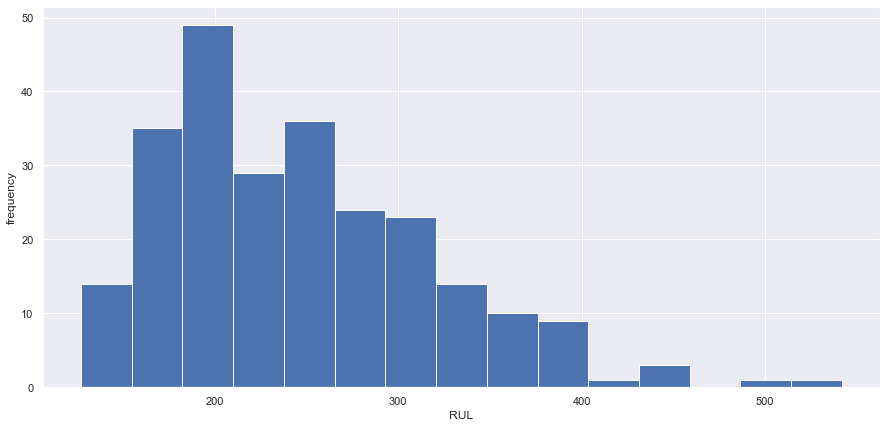

In [66]:
# distribution of RUL, similar to the 'describe function' of time_cycles above, but visual
df_max_rul = train[['unit_nr', 'RUL']].groupby('unit_nr').max().reset_index()
df_max_rul['RUL'].hist(bins=15, figsize=(15,7))
plt.xlabel('RUL')
plt.ylabel('frequency')
plt.show()

<AxesSubplot:xlabel='RUL', ylabel='Count'>

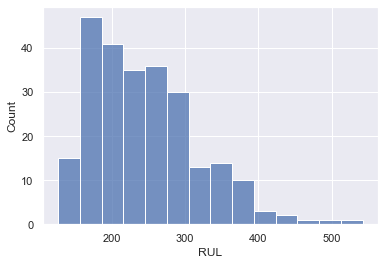

In [67]:
sns.histplot(df_max_rul['RUL'])

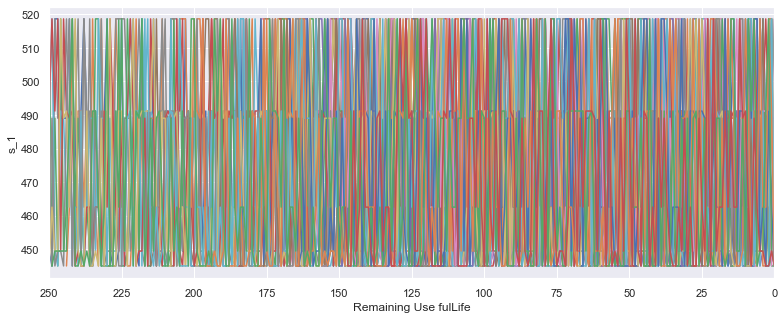

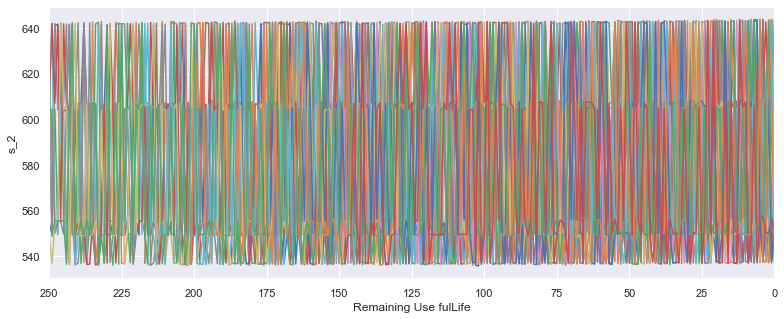

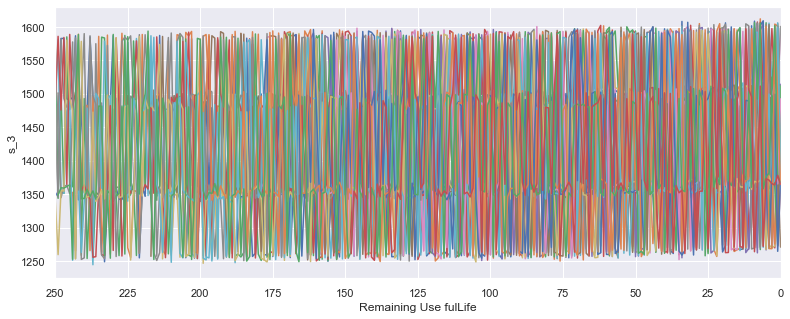

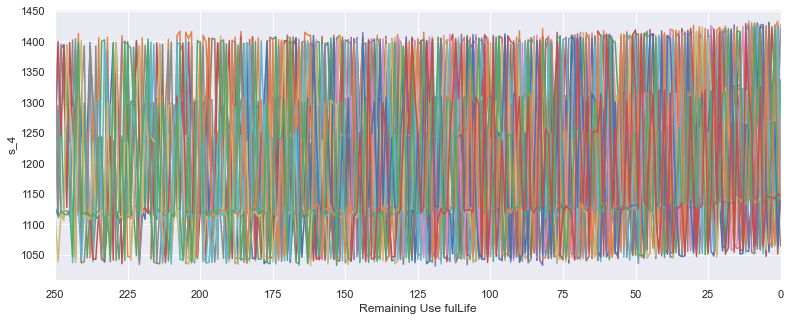

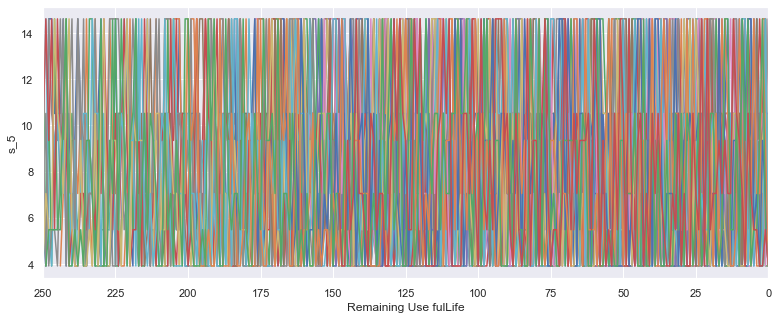

...

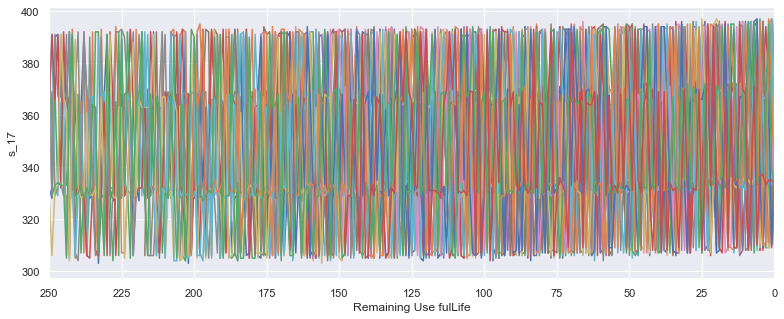

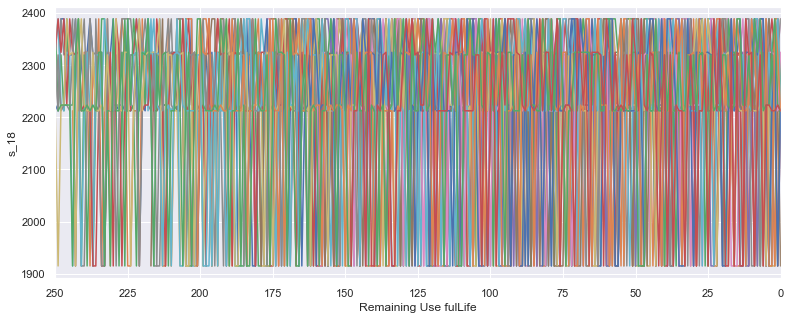

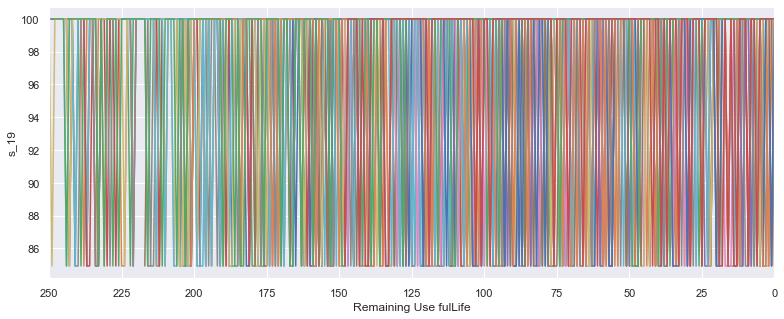

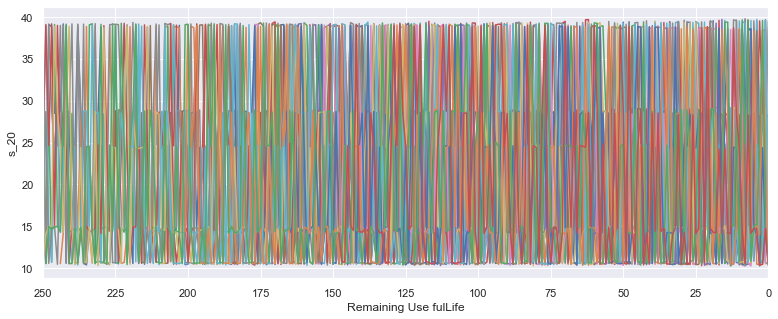

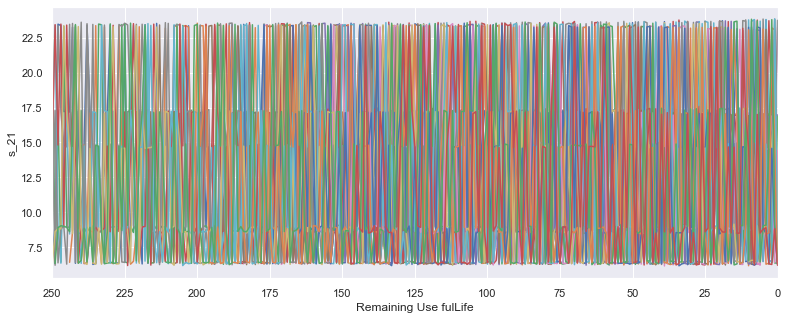

In [68]:
def plot_sensor(sensor_name):
    plt.figure(figsize=(13,5))
    for i in train['unit_nr'].unique():
        if (i % 10 == 0):  # only plot every 10th unit_nr
            plt.plot('RUL', sensor_name, 
                     data=train[train['unit_nr']==i])
    plt.xlim(250, 0)  # reverse the x-axis so RUL counts down to zero
    plt.xticks(np.arange(0, 275, 25))
    plt.ylabel(sensor_name)
    plt.xlabel('Remaining Use fulLife')
    plt.show()

for sensor_name in sensor_names:
    plot_sensor(sensor_name)

based on the plots you can see sensors 1, 5, 6, 10, 16, 18 and 19 hold no information related to Remaining Useful Life as the sensor values remain constant throughout time

Time to create our baseline model which takes into account all sensors which hold some information related to RUL

In [69]:
drop_sensors = []
drop_labels = index_names+setting_names+drop_sensors

X_train = train.drop(drop_labels, axis=1)
X_train

,s_1,s_2,s_3,s_4,s_5,s_6,s_7,s_8,s_9,s_10,...,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21,RUL
0,445.00,549.68,1343.43,1112.93,3.91,5.70,137.36,2211.86,8311.32,1.01,...,2387.99,8074.83,9.3335,0.02,330,2212,100.00,10.62,6.3670,320
1,491.19,606.07,1477.61,1237.50,9.35,13.61,332.10,2323.66,8713.60,1.07,...,2387.73,8046.13,9.1913,0.02,361,2324,100.00,24.37,14.6552,319
2,445.00,548.95,1343.12,1117.05,3.91,5.69,138.18,2211.92,8306.69,1.01,...,2387.97,8066.62,9.4007,0.02,329,2212,100.00,10.48,6.4213,318
3,445.00,548.70,1341.24,1118.03,3.91,5.70,137.98,2211.88,8312.35,1.02,...,2388.02,8076.05,9.3369,0.02,328,2212,100.00,10.54,6.4176,317
4,462.54,536.10,1255.23,1033.59,7.05,9.00,174.82,1915.22,7994.94,0.93,...,2028.08,7865.80,10.8366,0.02,305,1915,84.93,14.03,8.6754,316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61244,489.05,605.33,1516.36,1315.28,10.52,15.46,404.59,2319.66,8840.16,1.27,...,2388.73,8185.69,8.4541,0.03,372,2319,100.00,29.11,17.5234,4
61245,518.67,643.42,1598.92,1426.77,14.62,21.57,567.59,2388.47,9117.12,1.31,...,2388.46,8185.47,8.2221,0.03,396,2388,100.00,39.38,23.7151,3
61246,518.67,643.68,1607.72,1430.56,14.62,21.57,569.04,2388.51,9126.53,1.31,...,2388.48,8193.94,8.2525,0.03,395,2388,100.00,39.78,23.8270,2
61247,449.44,555.77,1381.29,1148.18,5.48,7.96,199.93,2223.78,8403.64,1.05,...,2388.83,8125.64,9.0515,0.02,337,2223,100.00,15.26,9.0774,1


C:\Users\Welcome\anaconda3\envs\tf\lib\site-packages\seaborn\axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


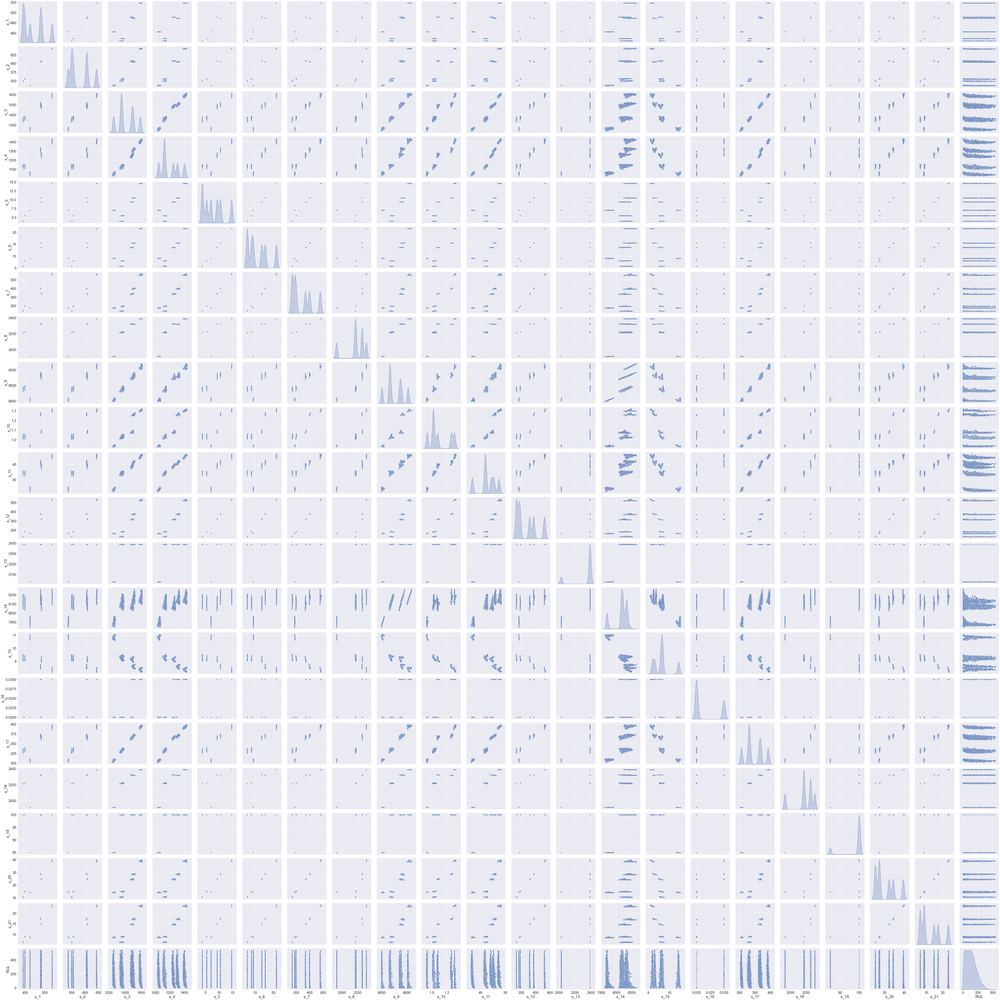

In [70]:
import seaborn as sns

sns.set(font_scale=2)
sns.pairplot(X_train,size=4,markers="o",diag_kind="kde")

<AxesSubplot:>

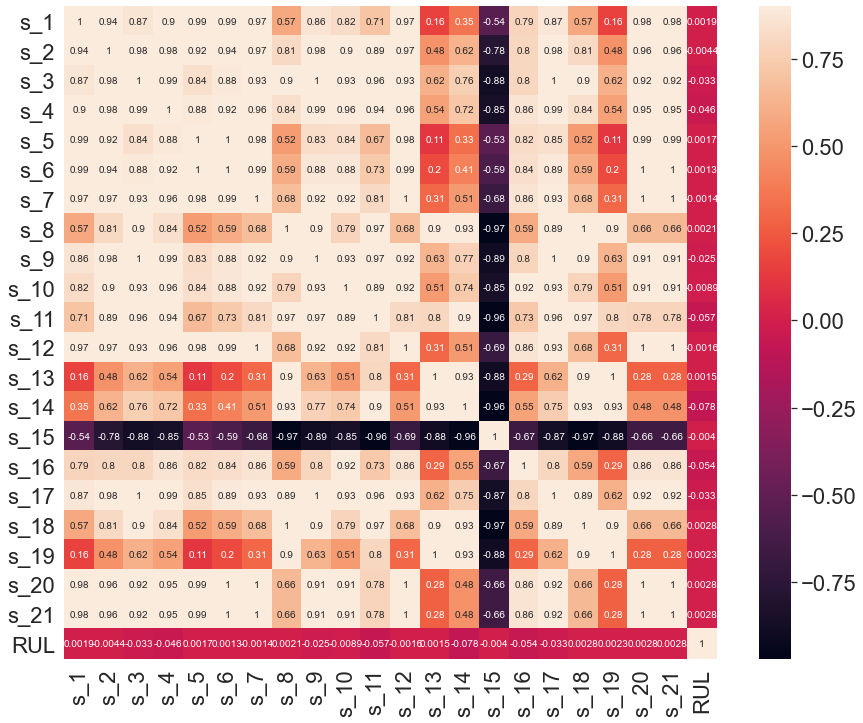

In [71]:
%matplotlib inline
import matplotlib.pyplot as plt  # Matlab-style plotting

corrmat = X_train.corr()
plt.subplots(figsize=(15,12))
sns.heatmap(corrmat, vmax=0.9, square=True,annot=True)    

<AxesSubplot:>

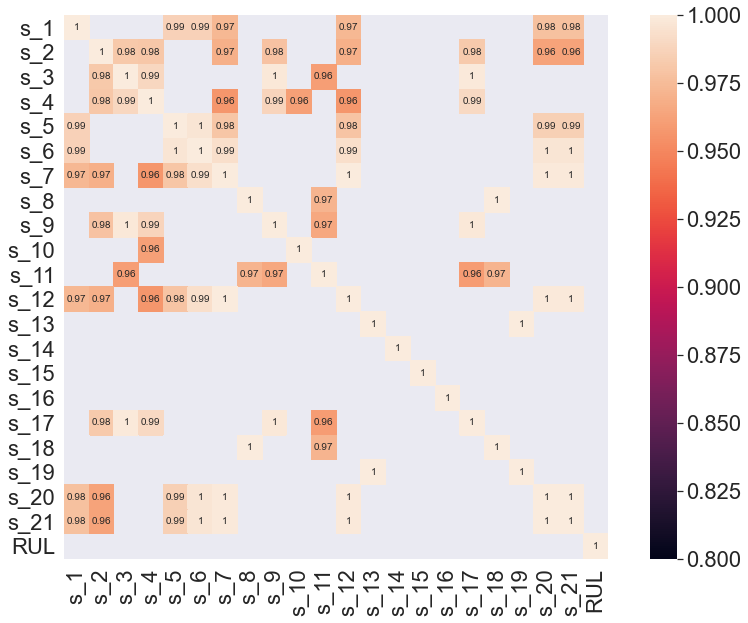

In [72]:
plt.subplots(figsize=(15,10))
hot_corrmat=corrmat[corrmat>0.95]
sns.heatmap(hot_corrmat, vmin=0.8, vmax=1, square=True,annot=True)

In [73]:
# strong positive correalated, after filtering
#S_1   2   S_8 10   S13, 14, S15, S16   18, _S_19   

#negative correalated

#S15



<AxesSubplot:>

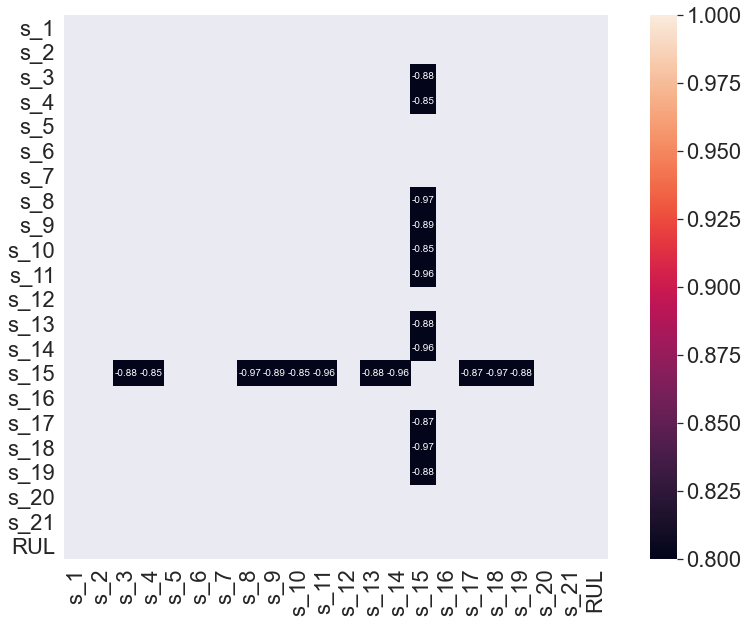

In [74]:
plt.subplots(figsize=(15,10))
cold_corrmat=corrmat[corrmat<-0.8]
sns.heatmap(cold_corrmat, vmin=0.8, vmax=1, square=True,annot=True)

In [75]:
# S_9 and s_14,       S_4 andS_12,    S_7 and S_11  S_11andS12
#keep   S_9, S_12   S11,  remove   S_14, S4, S7 

In [76]:
drop_sensors2 = ['s_3','s_4','s_5','s_6','s_7','s_9','s_11','s_12','s_17','s_20','s_21']

drop_labels=drop_labels+drop_sensors2
X_train = train.drop(drop_labels, axis=1)
X_train

,s_1,s_2,s_8,s_10,s_13,s_14,s_15,s_16,s_18,s_19,RUL
0,445.00,549.68,2211.86,1.01,2387.99,8074.83,9.3335,0.02,2212,100.00,320
1,491.19,606.07,2323.66,1.07,2387.73,8046.13,9.1913,0.02,2324,100.00,319
2,445.00,548.95,2211.92,1.01,2387.97,8066.62,9.4007,0.02,2212,100.00,318
3,445.00,548.70,2211.88,1.02,2388.02,8076.05,9.3369,0.02,2212,100.00,317
4,462.54,536.10,1915.22,0.93,2028.08,7865.80,10.8366,0.02,1915,84.93,316
...,...,...,...,...,...,...,...,...,...,...,...
61244,489.05,605.33,2319.66,1.27,2388.73,8185.69,8.4541,0.03,2319,100.00,4
61245,518.67,643.42,2388.47,1.31,2388.46,8185.47,8.2221,0.03,2388,100.00,3
61246,518.67,643.68,2388.51,1.31,2388.48,8193.94,8.2525,0.03,2388,100.00,2
61247,449.44,555.77,2223.78,1.05,2388.83,8125.64,9.0515,0.02,2223,100.00,1


## Baseline Regression

In [77]:
# first create an evaluate function
def evaluate(y_true, y_hat, label='test'):
    mse = mean_squared_error(y_true, y_hat)
    rmse = np.sqrt(mse)
    variance = r2_score(y_true, y_hat)
    print('{} set RMSE:{}, R2:{}'.format(label, rmse, variance))

In [78]:

y_train = X_train.pop('RUL')

# Since the true RUL values for the test set are only provided for the last time cycle of each enginge, 
# the test set is subsetted to represent the same
X_test = test.groupby('unit_nr').last().reset_index().drop(drop_labels, axis=1)


print(X_train.columns)  # check remaining columns

Index(['s_1', 's_2', 's_8', 's_10', 's_13', 's_14', 's_15', 's_16', 's_18',
       's_19'],
      dtype='object')


In [79]:
# create and fit model
lm = LinearRegression()
lm.fit(X_train, y_train)

# predict and evaluate
y_hat_train = lm.predict(X_train)
evaluate(y_train, y_hat_train, 'train')

y_hat_test = lm.predict(X_test)
evaluate(y_test, y_hat_test)

train set RMSE:70.58278788259811, R2:0.38196550693187115
test set RMSE:56.45449167054319, R2:-0.07207428357207357


In [81]:
print('train RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_train, y_hat_train))))
print('train R2: {0:.3f}'.format(r2_score(y_train, y_hat_train)))

print('test RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_test, y_hat_test))))
print('test R2: {0:.3f}'.format(r2_score(y_test, y_hat_test)))

train RMSE: 7.06e+01
train R2: 0.382
test RMSE: 5.65e+01
test R2: -0.072


Note the RMSE on the test set is lower. This may be explained because the RUL of the training set contains more samples of high RUL compared to the test set and high RUL does not necessarily correlate with the sensor signals. See image below

Text(0, 0.5, 'Test_predicted')

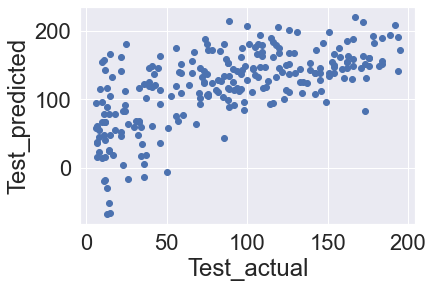

In [25]:
plt.scatter(y_test, y_hat_test)
plt.xlabel("Test_actual")
plt.ylabel("Test_predicted")


In [26]:


from sklearn.preprocessing import PolynomialFeatures

RMSE_train = []
RMSE_test = []
for degree in range(2, 10,2):
    steps_h = [('poly', PolynomialFeatures(degree = degree)),
               ('Rescale', MinMaxScaler()),
               ('lr', LinearRegression())]
    model_h = Pipeline(steps_h)
    model_h.fit(X_train, y_train)
    y_train_pred_h = model_h.predict(X_train)
    y_test_pred_h = model_h.predict(X_test)
    RMSE_train.append(np.sqrt(mean_squared_error(y_train, y_train_pred_h)))
    RMSE_test.append(np.sqrt(mean_squared_error(y_test, y_test_pred_h)))

KeyboardInterrupt: 

In [ ]:
plt.plot(np.linspace(2, 10, 4), RMSE_train)

In [ ]:
plt.plot(np.linspace(2, 10, 4), RMSE_test)

In [28]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.preprocessing import PolynomialFeatures

In [25]:
from sklearn.linear_model import Lasso

# hide warning message
import warnings
warnings.filterwarnings("once")

In [26]:
#alphas = range(1, 30)
alphas = [0.001,0.01,1,5,10]
rmse_train = []
rmse_test = []
mae_train = []
mae_test = []
r2_train = []
r2_test = []
coef=[]

for alpha in alphas:
    steps = [('poly', PolynomialFeatures(degree=30)),
             ('rescale', MinMaxScaler()),
             ('lr', Lasso(alpha=alpha))]
    model = Pipeline(steps)
    model = model.fit(X_train, y_train)
    
    rmse_train.append(np.sqrt(mean_squared_error(y_train, model.predict(X_train))))
    rmse_test.append(np.sqrt(mean_squared_error(y_test, model.predict(X_test))))
    
    mae_train.append(mean_absolute_error(y_train, model.predict(X_train)))
    mae_test.append(mean_absolute_error(y_test, model.predict(X_test)))
    
    r2_train.append(r2_score(y_train, model.predict(X_train)))
    r2_test.append(r2_score(y_test, model.predict(X_test)))
    coef.append(model.named_steps['lr'].coef_)
    
    #
                   
#('lr', Lasso(alpha=alpha, max_iter=100000))]

C:\Users\Welcome\anaconda3\envs\tf\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


MemoryError: Unable to allocate 474. TiB for an array with shape (20631, 3159461968) and data type float64

In [ ]:
plt.plot(alphas, mse_train,'b',linewidth=2,label="rmse_train" )
plt.plot(alphas, mse_test, 'r',linewidth=2,label="rmse_test")

In [26]:
#RF
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [29]:
steps = [('rescale', StandardScaler()),
         ('rfm', RandomForestRegressor(oob_score=True))]
model = Pipeline(steps)
model = model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print('train MSE: {0:.2e}'.format(mean_squared_error(y_train, y_train_pred)))
print('train R2: {0:.3f}'.format(r2_score(y_train, y_train_pred)))

print('test MSE: {0:.2e}'.format(mean_squared_error(y_test, y_test_pred)))
print('test R2: {0:.3f}'.format(r2_score(y_test, y_test_pred)))

train MSE: 5.26e+02
train R2: 0.935
test MSE: 2.23e+03
test R2: 0.249


In [170]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer

scorer = make_scorer(mean_squared_error, greater_is_better = False)


param_grid={'rfm__max_depth':np.arange(1,10,2).tolist(),
             'rfm__min_samples_leaf':np.arange(1,10,2).tolist(),  
             'rfm__min_samples_split':np.arange(2,10,2).tolist()}


steps = [('rescale', StandardScaler()),
         ('rfm', RandomForestRegressor(n_jobs=-1))]
model = Pipeline(steps)


grid_search=GridSearchCV(model,param_grid,cv=5,scoring=scorer,return_train_score=True)
              

grid_search.fit(X_train, y_train)
grid_search.best_params_

{'rfm__max_depth': 9, 'rfm__min_samples_leaf': 5, 'rfm__min_samples_split': 6}

['rfm__max_depth', 'rfm__min_samples_leaf', 'rfm__min_samples_split']
{'rfm__max_depth': [1, 3, 5, 7, 9], 'rfm__min_samples_leaf': [1, 3, 5, 7, 9], 'rfm__min_samples_split': [2, 4, 6, 8]}
[10 30 50 70 90]
[1, 3, 5, 7, 9]
[82 86 90 94 98]
[1, 3, 5, 7, 9]
[88 89 90 91]
[2, 4, 6, 8]


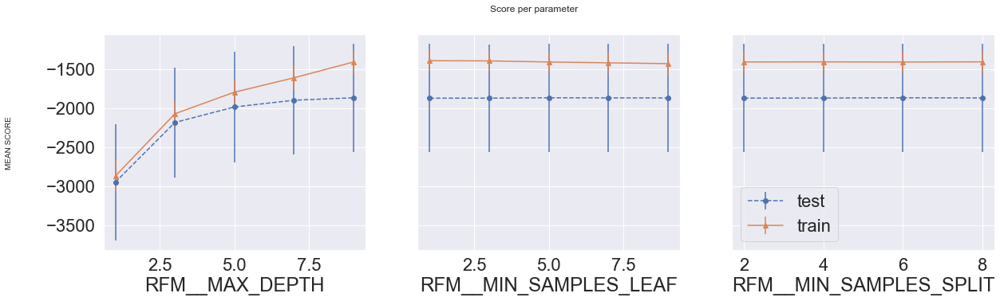

In [171]:
def plot_search_results(grid):
    """
    Params: 
        grid: A trained GridSearchCV object.
    """
    ## Results from grid search
    results = grid.cv_results_
    means_test = results['mean_test_score']
    stds_test = results['std_test_score']
    means_train = results['mean_train_score']
    stds_train = results['std_train_score']

    ## Getting indexes of values per hyper-parameter
    masks=[]
    masks_names= list(grid.best_params_.keys())
    for p_k, p_v in grid.best_params_.items():
        masks.append(list(results['param_'+p_k].data==p_v))              ##
    print(masks_names)
    

    params=grid.param_grid
    print(params)
    
   
    ## Ploting results
    fig, ax = plt.subplots(1,len(params),sharex='none', sharey='all',figsize=(20,5))
    fig.suptitle('Score per parameter')
    fig.text(0.04, 0.5, 'MEAN SCORE', va='center', rotation='vertical')
    
    pram_preformace_in_best = {}                         #{}
    
    for i, p in enumerate(masks_names):
        m = np.stack(masks[:i] + masks[i+1:])           ##
        pram_preformace_in_best
        best_parms_mask = m.all(axis=0)
        best_index = np.where(best_parms_mask)[0]
        #  best_index   [ 1  4  7 10 13 16 19 22]
        print(best_index)
        
        print(params[p])
        
        x = np.array(params[p])
        y_1 = np.array(means_test[best_index])
        e_1 = np.array(stds_test[best_index])
        y_2 = np.array(means_train[best_index])
        e_2 = np.array(stds_train[best_index])
        
        ax[i].errorbar(x, y_1, e_1, linestyle='--', marker='o', label='test')
        ax[i].errorbar(x, y_2, e_2, linestyle='-', marker='^',label='train' )
        
        ax[i].set_xlabel(p.upper())

    plt.legend()
    plt.show()

plot_search_results(grid_search)


In [31]:
# with tunned parameters


steps = [('rescale', StandardScaler()),
         ('rfm', RandomForestRegressor(max_depth=9, min_samples_leaf=7, min_samples_split=6))]
model = Pipeline(steps)
model = model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

print('train RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_train, y_train_pred))))
print('train R2: {0:.3f}'.format(r2_score(y_train, y_train_pred)))

print('test RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_test, y_test_pred))))
print('test R2: {0:.3f}'.format(r2_score(y_test, y_test_pred)))


train RMSE: 5.90e+01
train R2: 0.568
test RMSE: 4.44e+01
test R2: 0.337


Text(0, 0.5, 'Test_predicted')

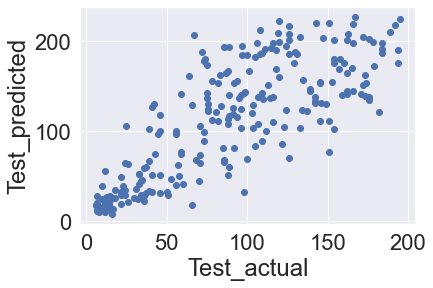

In [33]:
plt.scatter(y_test, y_test_pred)
plt.xlabel("Test_actual")
plt.ylabel("Test_predicted")


In [27]:
X_train

,s_1,s_2,s_8,s_10,s_13,s_14,s_15,s_16,s_18,s_19
0,445.00,549.68,2211.86,1.01,2387.99,8074.83,9.3335,0.02,2212,100.00
1,491.19,606.07,2323.66,1.07,2387.73,8046.13,9.1913,0.02,2324,100.00
2,445.00,548.95,2211.92,1.01,2387.97,8066.62,9.4007,0.02,2212,100.00
3,445.00,548.70,2211.88,1.02,2388.02,8076.05,9.3369,0.02,2212,100.00
4,462.54,536.10,1915.22,0.93,2028.08,7865.80,10.8366,0.02,1915,84.93
...,...,...,...,...,...,...,...,...,...,...
61244,489.05,605.33,2319.66,1.27,2388.73,8185.69,8.4541,0.03,2319,100.00
61245,518.67,643.42,2388.47,1.31,2388.46,8185.47,8.2221,0.03,2388,100.00
61246,518.67,643.68,2388.51,1.31,2388.48,8193.94,8.2525,0.03,2388,100.00
61247,449.44,555.77,2223.78,1.05,2388.83,8125.64,9.0515,0.02,2223,100.00


C:\Users\Welcome\anaconda3\envs\tf\lib\site-packages\seaborn\axisgrid.py:1912: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


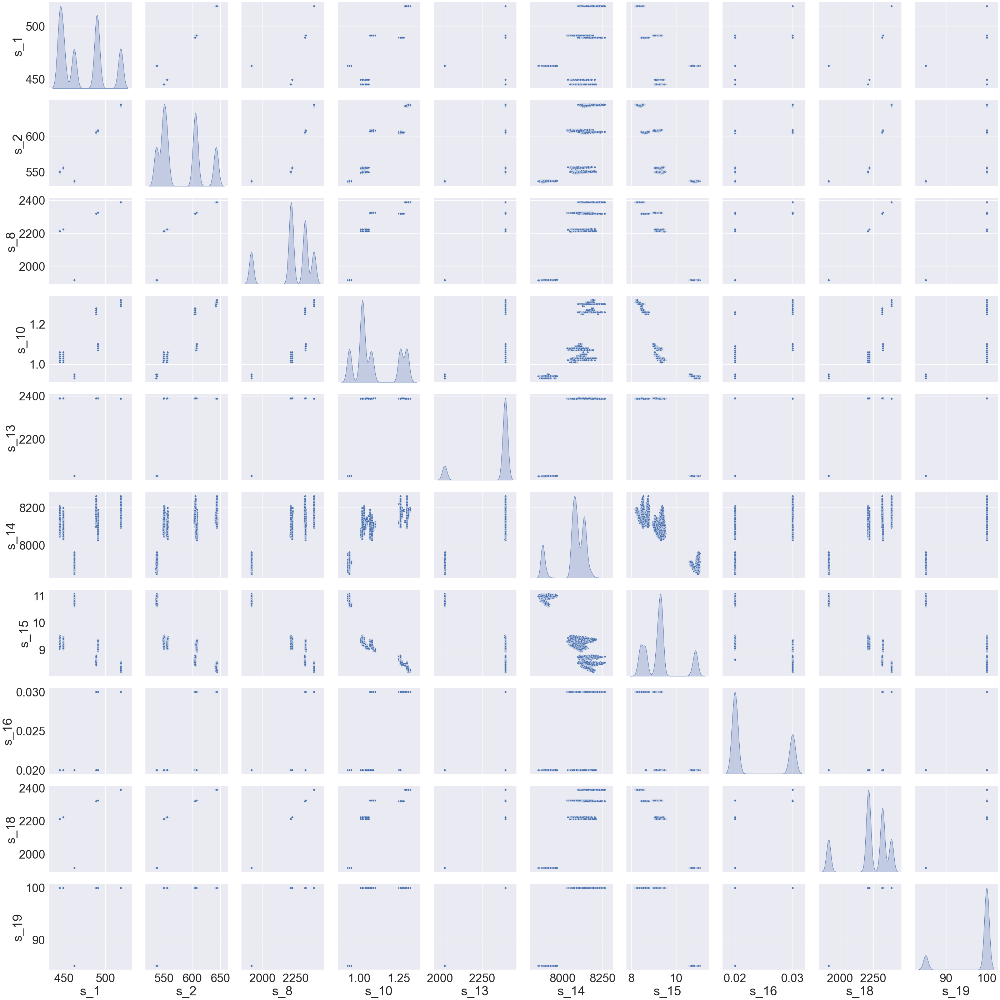

In [30]:
## feature engineering

import seaborn as sns

sns.set(font_scale=3)
sns.pairplot(X_train,size=4,markers="o",diag_kind="kde")

In [26]:

x_train=X_train
x_train['s_22']=x_train['s_1']*x_train['s_13']
x_train['s_23']=(x_train['s_18']+x_train['s_8'])/x_train['s_19']

x_test=X_test
x_test['s_22']=x_test['s_1']*x_test['s_13']
x_test['s_23']=(x_test['s_18']+x_test['s_8'])/x_test['s_19']

In [33]:
X_test

,s_1,s_2,s_8,s_10,s_13,s_14,s_15,s_16,s_18,s_19,s_22,s_23
0,462.54,537.66,1915.66,0.94,2028.53,7890.31,10.7615,0.02,1915,84.93,9.382763e+05,45.103732
1,445.00,549.96,2211.69,1.02,2387.72,8073.44,9.3925,0.02,2212,100.00,1.062535e+06,44.236900
2,445.00,549.47,2212.04,1.02,2388.18,8095.58,9.2974,0.02,2212,100.00,1.062740e+06,44.240400
3,462.54,536.06,1915.39,0.94,2028.30,7878.63,10.8396,0.02,1915,84.93,9.381699e+05,45.100553
4,462.54,537.36,1915.36,0.94,2028.24,7873.75,10.9094,0.02,1915,84.93,9.381421e+05,45.100200
...,...,...,...,...,...,...,...,...,...,...,...,...
243,491.19,607.94,2324.21,1.08,2388.39,8094.02,9.2557,0.02,2324,100.00,1.173153e+06,46.482100
244,491.19,606.61,2323.93,1.08,2388.03,8066.79,9.1421,0.02,2324,100.00,1.172976e+06,46.479300
245,491.19,606.82,2323.90,1.08,2388.02,8060.86,9.1768,0.02,2324,100.00,1.172972e+06,46.479000
246,462.54,536.91,1915.31,0.94,2028.24,7878.48,10.9332,0.02,1915,84.93,9.381421e+05,45.099611


In [37]:
#3feature engineering improvement

steps = [('rescale', StandardScaler()),
         ('rfm', RandomForestRegressor())]
model = Pipeline(steps)
model = model.fit(x_train, y_train)

y_train_pred = model.predict(x_train)
y_test_pred = model.predict(x_test)


print('train RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_train, y_train_pred))))
print('train R2: {0:.3f}'.format(r2_score(y_train, y_train_pred)))

print('test RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_test, y_test_pred))))
print('test R2: {0:.3f}'.format(r2_score(y_test, y_test_pred)))

train RMSE: 2.29e+01
train R2: 0.935
test RMSE: 4.66e+01
test R2: 0.269


Text(0, 0.5, 'Test_predicted')

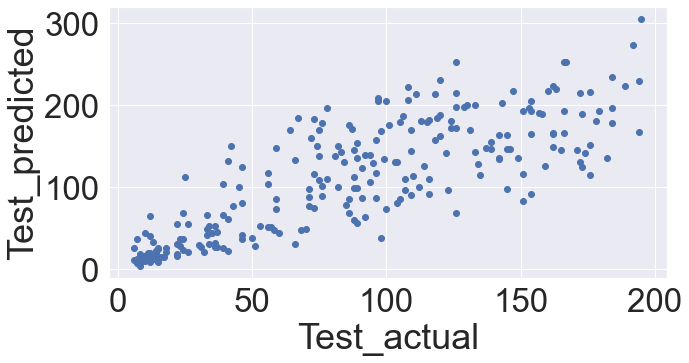

In [38]:
plt.figure(figsize = (10, 5))

plt.scatter(y_test, y_test_pred)
plt.xlabel("Test_actual")
plt.ylabel("Test_predicted")

In [176]:

train RMSE: 4.19e+01
train R2: 0.631
test RMSE: 2.87e+01
test R2: 0.529

In [60]:
#LSTM

C:\Users\Welcome\anaconda3\envs\tf\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [26]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import optimizers, Sequential
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from pylab import rcParams

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Model
# from keras.utils import plot_model
from tensorflow.keras.layers import Dense, LSTM, RepeatVector, TimeDistributed,Dropout, Activation
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, precision_recall_curve
from sklearn.metrics import recall_score, classification_report, auc, roc_curve
from sklearn.metrics import precision_recall_fscore_support, f1_score

from numpy.random import seed
seed(7)

import tensorflow
tensorflow.random.set_seed(11)
import time

from sklearn.model_selection import train_test_split

SEED = 123 #used to help randomly select the data points
DATA_SPLIT_PCT = 0.2

rcParams['figure.figsize'] = 8, 6

In [27]:
n_features = X_train.shape[1]  # nu

def temporalize(X, y, lookback):                                  ###.values
    output_X = []  
    output_y = []
    for i in range(len(X)-lookback-1):
        t = []
        for j in range(1,lookback+1):
            # Gather past records upto the lookback period
            t.append(X[[(i+j+1)], :])
        output_X.append(t)
        output_y.append(y[i+lookback+1])
    return output_X, output_y
   
lookback=1

# Temporalize the data
X_train, y_train = temporalize(X = X_train.values, y = y_train.values, lookback = lookback)


X_test, y_test = temporalize(X = X_test.values, y = y_test.values, lookback = lookback)


In [28]:
X_train = np.array(X_train)                             #[:23520]              ################
y_train = np.array(y_train)
X_test = np.array(X_test) 
y_test = np.array(y_test)                                # then cut the training results

In [29]:
X_train = X_train.reshape(X_train.shape[0], lookback, n_features)
X_test = X_test.reshape(X_test.shape[0], lookback, n_features)

In [30]:
def flatten(X):
    '''
    Flatten a 3D array.
    Input
    X            A 3D array for lstm, where the array is sample x timesteps x features.
    Output
    flattened_X  A 2D array, sample x features.
    '''
    flattened_X = np.empty((X.shape[0], X.shape[2]))  # sample x features array.
    for i in range(X.shape[0]):
        flattened_X[i] = X[i, (X.shape[1]-1), :]
    return(flattened_X)

def scale(X, scaler):
    '''
    Scale 3D array.
    Inputs
    X            A 3D array for lstm, where the array is sample x timesteps x features.
    scaler       A scaler object, e.g., sklearn.preprocessing.StandardScaler, sklearn.preprocessing.normalize
    Output
    X            Scaled 3D array.
    '''
    for i in range(X.shape[0]):
        X[i, :, :] = scaler.transform(X[i, :, :])
        
    return X

In [31]:
scaler = StandardScaler().fit(flatten(X_train))                                   ###### discussion  use X0train now   _y0
X_train_scaled = scale(X_train, scaler)
X_test_scaled = scale(X_test, scaler)


In [32]:
'''
Test: Check if the scaling is correct.

The test succeeds if all the column means 
and variances are 0 and 1, respectively, after
flattening.
'''
a = flatten(X_train_scaled)
print('colwise mean', np.mean(a, axis=0).round(6))
print('colwise variance', np.var(a, axis=0))

colwise mean [-0. -0.  0. -0. -0.  0.  0.  0.  0.  0.]
colwise variance [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [33]:
timesteps =  X_train_scaled.shape[1] # equal to the lookback
n_features =  X_train_scaled.shape[2] # 

In [34]:
lr=0.002
adam = keras.optimizers.Adam(lr, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)

timesteps=1
n_features=X_train.shape[-1]

#Building the model
model = Sequential()

model.add(LSTM(128, activation='relu', input_shape=(timesteps, n_features), return_sequences=True))
model.add(Dropout(0.5))

model.add(LSTM(64, return_sequences=False))
model.add(Dropout(0.5))

model.add(Dense(units=1))
model.add(Activation('linear'))  #linear

start = time.time()
model.compile(loss='mse', optimizer=adam, metrics=['mse'])
print('compilation time : {}'.format(time.time() - start))

model.summary()

compilation time : 0.008997201919555664
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 1, 128)            71168     
_________________________________________________________________
dropout (Dropout)            (None, 1, 128)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 1)                 65        
_________________________________________________________________
activation (Activation)      (None, 1)                 0         
Total params: 120,641
Trainable params: 120,641
Non-trainable params: 0
__________

In [35]:
#model.fit(X_train_y0, y_pressure_train_y0, batch_size=256, epochs=500, validation_split=0.1)
import os
#from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping



checkpoint_path = "./cp/cp-{epoch:04d}.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

cp = ModelCheckpoint(filepath=checkpoint_path,      
                               save_best_only=False,    #true
                               save_freq='epoch',           #every epoch
                               save_weights_only=False,
                               verbose=0)

tb =TensorBoard(log_dir='./tb/',
                histogram_freq=0,
                write_graph=True,
                write_images=True)


model.fit(X_train, y_train, batch_size=256, epochs=50, validation_split=0.2) #,callbacks=[tb, cp]

# X_train_y0,X_train_y0[2]  !!!
# X_train_y0,X_train_y0

Epoch 1/50
192/192 [==============================] - 3s 13ms/step - loss: 21952.0293 - mse: 21952.0293 - val_loss: 16864.6172 - val_mse: 16864.6172
Epoch 2/50
192/192 [==============================] - 2s 9ms/step - loss: 17063.6973 - mse: 17063.6973 - val_loss: 13603.6191 - val_mse: 13603.6191
Epoch 3/50
192/192 [==============================] - 2s 9ms/step - loss: 14184.9033 - mse: 14184.9033 - val_loss: 11327.4414 - val_mse: 11327.4414
Epoch 4/50
192/192 [==============================] - 2s 9ms/step - loss: 12167.2783 - mse: 12167.2783 - val_loss: 9751.0703 - val_mse: 9751.0703
Epoch 5/50
192/192 [==============================] - 2s 9ms/step - loss: 10744.9463 - mse: 10744.9463 - val_loss: 8698.9678 - val_mse: 8698.9678
Epoch 6/50
192/192 [==============================] - 2s 9ms/step - loss: 9838.9707 - mse: 9838.9707 - val_loss: 8032.5503 - val_mse: 8032.5503
Epoch 7/50
192/192 [==============================] - 2s 9ms/step - loss: 9234.5049 - mse: 9234.5049 - val_loss: 7635.3

C:\Users\Welcome\anaconda3\envs\tf\lib\site-packages\ipykernel_launcher.py:4: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  after removing the cwd from sys.path.


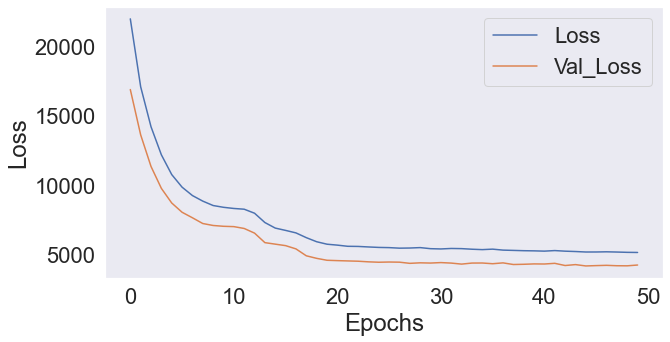

In [36]:
#Visualizing training and validaton loss
plt.figure(figsize = (10, 5))
plt.plot(model.history.history['loss'], label = 'Loss')
plt.plot(model.history.history['val_loss'], Label = 'Val_Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()

In [37]:
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

Text(0, 0.5, 'Test_predicted')

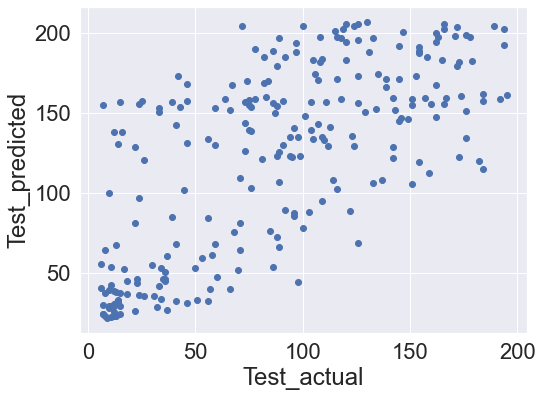

In [38]:
plt.scatter(y_test, y_test_pred)
plt.xlabel("Test_actual")
plt.ylabel("Test_predicted")


In [39]:
print('train RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_train, y_train_pred))))
print('train R2: {0:.3f}'.format(r2_score(y_train, y_train_pred)))

print('test RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_test, y_test_pred))))
print('test R2: {0:.3f}'.format(r2_score(y_test, y_test_pred)))

train RMSE: 6.78e+01
train R2: 0.430
test RMSE: 5.60e+01
test R2: -0.057


In [48]:
def LSTMREG(epochs = 4, batch = 256, lr=0.0003):
    model = Sequential()

    model.add(LSTM(128, activation='relu', input_shape=(timesteps, n_features), return_sequences=True))
    model.add(Dropout(0.5))

    model.add(LSTM(64, return_sequences=False))
    model.add(Dropout(0.5))

    model.add(Dense(units=1))
    model.add(Activation('linear'))  #linear
    model.summary()

    start = time.time()
    adam = keras.optimizers.Adam(lr, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
    model.compile(loss='mse', optimizer=adam, metrics=['mse'])
    print('compilation time : {}'.format(time.time() - start))
    
    return model


In [49]:
keras_reg = keras.wrappers.scikit_learn.KerasRegressor(LSTMREG)
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer
 

keras_param_space = {"epochs": [50,100],
                      "batch_size": [16,32,64,128,256],
                      "lr": [0.00002,0.0001,0.0004,0.003,0.001] 
}

keras_rand_search = GridSearchCV(keras_reg, keras_param_space, cv=3)                               # scoring="accuracy", n_jobs=1, verbose=True)

keras_rand_search.fit(X_train, y_train, batch_size=256, epochs=50, validation_split=0.2)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 1, 128)            71168     
_________________________________________________________________
dropout_2 (Dropout)          (None, 1, 128)            0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 64)                49408     
_________________________________________________________________
dropout_3 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 65        
_________________________________________________________________
activation_1 (Activation)    (None, 1)                 0         
Total params: 120,641
Trainable params: 120,641
Non-trainable params: 0
________________________________________________

Epoch 47/50
128/128 [==============================] - 1s 9ms/step - loss: 23558.6895 - mse: 23558.6895 - val_loss: 19345.6797 - val_mse: 19345.6797
Epoch 48/50
128/128 [==============================] - 1s 9ms/step - loss: 23514.7344 - mse: 23514.7344 - val_loss: 19301.6680 - val_mse: 19301.6680
Epoch 49/50
128/128 [==============================] - 1s 9ms/step - loss: 23458.0234 - mse: 23458.0234 - val_loss: 19258.7285 - val_mse: 19258.7285
Epoch 50/50
1276/1276 [==============================] - 3s 2ms/step - loss: 20962.6836 - mse: 20962.6836
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 1, 128)            71168     
_________________________________________________________________
dropout_4 (Dropout)          (None, 1, 128)            0         
_________________________________________________________________
lstm_5 (LSTM)                

128/128 [==============================] - 1s 9ms/step - loss: 23146.9551 - mse: 23146.9551 - val_loss: 21658.0156 - val_mse: 21658.0156
Epoch 38/50
128/128 [==============================] - 1s 9ms/step - loss: 23065.4570 - mse: 23065.4570 - val_loss: 21585.3711 - val_mse: 21585.3711
Epoch 39/50
128/128 [==============================] - 1s 9ms/step - loss: 22995.4238 - mse: 22995.4238 - val_loss: 21515.5898 - val_mse: 21515.5898
Epoch 40/50
128/128 [==============================] - 1s 9ms/step - loss: 22931.7637 - mse: 22931.7637 - val_loss: 21448.3613 - val_mse: 21448.3613
Epoch 41/50
128/128 [==============================] - 1s 10ms/step - loss: 22863.9922 - mse: 22863.9922 - val_loss: 21383.6641 - val_mse: 21383.6641
Epoch 42/50
128/128 [==============================] - 1s 9ms/step - loss: 22801.1309 - mse: 22801.1309 - val_loss: 21321.3633 - val_mse: 21321.3633
Epoch 43/50
128/128 [==============================] - 1s 9ms/step - loss: 22737.7266 - mse: 22737.7266 - val_loss: 2

128/128 [==============================] - 1s 9ms/step - loss: 19097.5938 - mse: 19097.5938 - val_loss: 16381.4639 - val_mse: 16381.4639
Epoch 28/50
128/128 [==============================] - 1s 9ms/step - loss: 18980.0430 - mse: 18980.0430 - val_loss: 16259.7158 - val_mse: 16259.7158
Epoch 29/50
128/128 [==============================] - 1s 9ms/step - loss: 18846.6074 - mse: 18846.6074 - val_loss: 16139.2412 - val_mse: 16139.2412
Epoch 30/50
128/128 [==============================] - 1s 9ms/step - loss: 18711.0293 - mse: 18711.0293 - val_loss: 16019.7031 - val_mse: 16019.7031
Epoch 31/50
128/128 [==============================] - 1s 9ms/step - loss: 18593.8203 - mse: 18593.8203 - val_loss: 15901.6592 - val_mse: 15901.6592
Epoch 32/50
128/128 [==============================] - 1s 9ms/step - loss: 18457.2773 - mse: 18457.2773 - val_loss: 15784.2656 - val_mse: 15784.2656
Epoch 33/50
128/128 [==============================] - 1s 9ms/step - loss: 18341.2461 - mse: 18341.2461 - val_loss: 15

128/128 [==============================] - 1s 9ms/step - loss: 15812.3906 - mse: 15812.3906 - val_loss: 12126.8691 - val_mse: 12126.8691
Epoch 18/50
128/128 [==============================] - 1s 9ms/step - loss: 15452.1602 - mse: 15452.1602 - val_loss: 11809.4736 - val_mse: 11809.4736
Epoch 19/50
128/128 [==============================] - 1s 9ms/step - loss: 15100.3027 - mse: 15100.3027 - val_loss: 11504.5771 - val_mse: 11504.5771
Epoch 20/50
128/128 [==============================] - 1s 9ms/step - loss: 14784.3145 - mse: 14784.3145 - val_loss: 11212.5742 - val_mse: 11212.5742
Epoch 21/50
128/128 [==============================] - 1s 9ms/step - loss: 14451.6123 - mse: 14451.6123 - val_loss: 10932.0869 - val_mse: 10932.0869
Epoch 22/50
128/128 [==============================] - 1s 9ms/step - loss: 14145.1738 - mse: 14145.1738 - val_loss: 10663.2529 - val_mse: 10663.2529
Epoch 23/50
128/128 [==============================] - 1s 9ms/step - loss: 13819.2998 - mse: 13819.2998 - val_loss: 10

Epoch 13/50
128/128 [==============================] - 1s 9ms/step - loss: 16275.4512 - mse: 16275.4512 - val_loss: 13616.8535 - val_mse: 13616.8535
Epoch 14/50
128/128 [==============================] - 1s 9ms/step - loss: 15885.8438 - mse: 15885.8438 - val_loss: 13242.4541 - val_mse: 13242.4541
Epoch 15/50
128/128 [==============================] - 1s 9ms/step - loss: 15479.6230 - mse: 15479.6230 - val_loss: 12882.0625 - val_mse: 12882.0625
Epoch 16/50
128/128 [==============================] - 1s 9ms/step - loss: 15095.4834 - mse: 15095.4834 - val_loss: 12536.4912 - val_mse: 12536.4912
Epoch 17/50
128/128 [==============================] - 1s 9ms/step - loss: 14724.0273 - mse: 14724.0273 - val_loss: 12204.5391 - val_mse: 12204.5391
Epoch 18/50
128/128 [==============================] - 1s 9ms/step - loss: 14390.9785 - mse: 14390.9785 - val_loss: 11885.8066 - val_mse: 11885.8066
Epoch 19/50
128/128 [==============================] - 1s 9ms/step - loss: 14028.4268 - mse: 14028.4268 - 

Epoch 9/50
128/128 [==============================] - 1s 9ms/step - loss: 18171.6406 - mse: 18171.6406 - val_loss: 16578.0957 - val_mse: 16578.0957
Epoch 10/50
128/128 [==============================] - 1s 9ms/step - loss: 17683.0469 - mse: 17683.0469 - val_loss: 16114.6855 - val_mse: 16114.6855
Epoch 11/50
128/128 [==============================] - 1s 9ms/step - loss: 17233.4844 - mse: 17233.4844 - val_loss: 15671.0293 - val_mse: 15671.0293
Epoch 12/50
128/128 [==============================] - 1s 9ms/step - loss: 16785.9609 - mse: 16785.9609 - val_loss: 15245.0576 - val_mse: 15245.0576
Epoch 13/50
128/128 [==============================] - 1s 9ms/step - loss: 16370.1670 - mse: 16370.1670 - val_loss: 14837.0391 - val_mse: 14837.0391
Epoch 14/50
128/128 [==============================] - 1s 9ms/step - loss: 15954.1582 - mse: 15954.1582 - val_loss: 14441.8389 - val_mse: 14441.8389
Epoch 15/50
128/128 [==============================] - 1s 9ms/step - loss: 15566.6426 - mse: 15566.6426 - v

Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 11575.6006 - mse: 11575.6006 - val_loss: 8087.1938 - val_mse: 8087.1938
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 10568.0879 - mse: 10568.0879 - val_loss: 7443.1655 - val_mse: 7443.1655
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9921.4268 - mse: 9921.4268 - val_loss: 7071.9619 - val_mse: 7071.9619
Epoch 8/50
128/128 [==============================] - 1s 9ms/step - loss: 9516.9414 - mse: 9516.9414 - val_loss: 6677.9976 - val_mse: 6677.9976
Epoch 9/50
128/128 [==============================] - 1s 9ms/step - loss: 9128.6328 - mse: 9128.6328 - val_loss: 6546.4229 - val_mse: 6546.4229
Epoch 10/50
128/128 [==============================] - 1s 9ms/step - loss: 8972.3525 - mse: 8972.3525 - val_loss: 6500.1895 - val_mse: 6500.1895
Epoch 11/50
128/128 [==============================] - 1s 9ms/step - loss: 8865.5625 - mse: 8865.5625 - val_loss: 6490.5088 - val_m

128/128 [==============================] - 3s 23ms/step - loss: 22269.8047 - mse: 22269.8047 - val_loss: 17785.6836 - val_mse: 17785.6836
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 17293.1387 - mse: 17293.1387 - val_loss: 14303.0928 - val_mse: 14303.0928
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 14318.9854 - mse: 14318.9854 - val_loss: 11876.4697 - val_mse: 11876.4697
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12256.0420 - mse: 12256.0420 - val_loss: 10182.8223 - val_mse: 10182.8223
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10802.4697 - mse: 10802.4697 - val_loss: 9038.8398 - val_mse: 9038.8398
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9856.9658 - mse: 9856.9658 - val_loss: 8293.7744 - val_mse: 8293.7744
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9234.4736 - mse: 9234.4736 - val_loss: 7832.2144 - val

128/128 [==============================] - 2s 15ms/step - loss: 25460.3066 - mse: 25460.3066 - val_loss: 18862.6797 - val_mse: 18862.6797
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 21941.9414 - mse: 21941.9414 - val_loss: 17046.2461 - val_mse: 17046.2461
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 20288.8535 - mse: 20288.8535 - val_loss: 15704.4688 - val_mse: 15704.4688
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 18930.5547 - mse: 18930.5547 - val_loss: 14550.2295 - val_mse: 14550.2295
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 17749.1797 - mse: 17749.1797 - val_loss: 13531.0146 - val_mse: 13531.0146
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 16680.4277 - mse: 16680.4277 - val_loss: 12620.4746 - val_mse: 12620.4746
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 15721.7188 - mse: 15721.7188 - val_loss: 11809.2

128/128 [==============================] - 2s 15ms/step - loss: 24171.1719 - mse: 24171.1719 - val_loss: 18957.2949 - val_mse: 18957.2949
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 20718.7207 - mse: 20718.7207 - val_loss: 17110.0469 - val_mse: 17110.0469
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 19073.7402 - mse: 19073.7402 - val_loss: 15758.8408 - val_mse: 15758.8408
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 17749.7656 - mse: 17749.7656 - val_loss: 14599.7695 - val_mse: 14599.7695
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 16580.5137 - mse: 16580.5137 - val_loss: 13577.6475 - val_mse: 13577.6475
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15545.9199 - mse: 15545.9199 - val_loss: 12666.8584 - val_mse: 12666.8584
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14615.2021 - mse: 14615.2021 - val_loss: 11854.2

128/128 [==============================] - 2s 14ms/step - loss: 24552.8535 - mse: 24552.8535 - val_loss: 20769.9121 - val_mse: 20769.9121
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 21100.7793 - mse: 21100.7793 - val_loss: 18789.0391 - val_mse: 18789.0391
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 19432.6250 - mse: 19432.6250 - val_loss: 17356.0859 - val_mse: 17356.0859
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 18095.0430 - mse: 18095.0430 - val_loss: 16123.9961 - val_mse: 16123.9961
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 16901.2266 - mse: 16901.2266 - val_loss: 15032.5020 - val_mse: 15032.5020
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15855.6289 - mse: 15855.6289 - val_loss: 14056.3818 - val_mse: 14056.3818
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14906.1582 - mse: 14906.1582 - val_loss: 13181.0

128/128 [==============================] - 2s 15ms/step - loss: 27265.4824 - mse: 27265.4824 - val_loss: 22826.7051 - val_mse: 22826.7051
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 27257.5020 - mse: 27257.5020 - val_loss: 22818.8770 - val_mse: 22818.8770
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 27248.3965 - mse: 27248.3965 - val_loss: 22809.3887 - val_mse: 22809.3887
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 27236.8184 - mse: 27236.8184 - val_loss: 22797.0195 - val_mse: 22797.0195
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 27221.6562 - mse: 27221.6562 - val_loss: 22780.2246 - val_mse: 22780.2246
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 27200.3867 - mse: 27200.3867 - val_loss: 22756.7637 - val_mse: 22756.7637
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 27170.9707 - mse: 27170.9707 - val_loss: 22723.7

128/128 [==============================] - 2s 14ms/step - loss: 25858.8496 - mse: 25858.8496 - val_loss: 22827.5234 - val_mse: 22827.5234
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25851.2539 - mse: 25851.2539 - val_loss: 22819.7031 - val_mse: 22819.7031
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25842.2207 - mse: 25842.2207 - val_loss: 22809.9336 - val_mse: 22809.9336
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25830.3340 - mse: 25830.3340 - val_loss: 22796.8340 - val_mse: 22796.8340
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 25814.4512 - mse: 25814.4512 - val_loss: 22778.7285 - val_mse: 22778.7285
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 25792.0781 - mse: 25792.0781 - val_loss: 22753.3594 - val_mse: 22753.3594
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 25761.4258 - mse: 25761.4258 - val_loss: 22717.7

128/128 [==============================] - 2s 15ms/step - loss: 26145.7344 - mse: 26145.7344 - val_loss: 24664.3750 - val_mse: 24664.3750
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 26138.4180 - mse: 26138.4180 - val_loss: 24656.5430 - val_mse: 24656.5430
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 26129.5176 - mse: 26129.5176 - val_loss: 24646.6074 - val_mse: 24646.6074
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 26117.8008 - mse: 26117.8008 - val_loss: 24633.1562 - val_mse: 24633.1562
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 26101.6113 - mse: 26101.6113 - val_loss: 24614.3535 - val_mse: 24614.3535
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 26079.0254 - mse: 26079.0254 - val_loss: 24587.6309 - val_mse: 24587.6309
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 26047.0059 - mse: 26047.0059 - val_loss: 24549.7

128/128 [==============================] - 2s 14ms/step - loss: 27245.8750 - mse: 27245.8750 - val_loss: 22779.6035 - val_mse: 22779.6035
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 27110.5117 - mse: 27110.5117 - val_loss: 22516.5352 - val_mse: 22516.5352
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 26602.5195 - mse: 26602.5195 - val_loss: 21841.1992 - val_mse: 21841.1992
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25854.4941 - mse: 25854.4941 - val_loss: 21156.1875 - val_mse: 21156.1875
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 25150.9141 - mse: 25150.9141 - val_loss: 20525.5293 - val_mse: 20525.5293
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 24517.6406 - mse: 24517.6406 - val_loss: 19996.9648 - val_mse: 19996.9648
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 24018.2051 - mse: 24018.2051 - val_loss: 19592.6

128/128 [==============================] - 2s 15ms/step - loss: 25837.5898 - mse: 25837.5898 - val_loss: 22778.6113 - val_mse: 22778.6113
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 25708.5156 - mse: 25708.5156 - val_loss: 22522.5996 - val_mse: 22522.5996
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25235.8164 - mse: 25235.8164 - val_loss: 21883.0332 - val_mse: 21883.0332
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 24535.4082 - mse: 24535.4082 - val_loss: 21225.0098 - val_mse: 21225.0098
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 23868.0078 - mse: 23868.0078 - val_loss: 20614.5898 - val_mse: 20614.5898
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 23267.4297 - mse: 23267.4297 - val_loss: 20106.1758 - val_mse: 20106.1758
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 22794.2148 - mse: 22794.2148 - val_loss: 19715.

128/128 [==============================] - 2s 15ms/step - loss: 26125.6152 - mse: 26125.6152 - val_loss: 24614.3184 - val_mse: 24614.3184
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 25993.7344 - mse: 25993.7344 - val_loss: 24344.2578 - val_mse: 24344.2578
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25474.9609 - mse: 25474.9609 - val_loss: 23604.3164 - val_mse: 23604.3164
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 24733.6641 - mse: 24733.6641 - val_loss: 22925.3828 - val_mse: 22925.3828
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 24073.0234 - mse: 24073.0234 - val_loss: 22297.8535 - val_mse: 22297.8535
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 23467.3672 - mse: 23467.3672 - val_loss: 21741.4492 - val_mse: 21741.4492
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 22962.7930 - mse: 22962.7930 - val_loss: 21303.

128/128 [==============================] - 2s 15ms/step - loss: 26932.8203 - mse: 26932.8203 - val_loss: 21655.2188 - val_mse: 21655.2188
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 24736.2715 - mse: 24736.2715 - val_loss: 19510.4434 - val_mse: 19510.4434
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 23149.9062 - mse: 23149.9062 - val_loss: 18549.0566 - val_mse: 18549.0566
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 22283.7520 - mse: 22283.7520 - val_loss: 17860.2852 - val_mse: 17860.2852
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 21594.5820 - mse: 21594.5820 - val_loss: 17261.2422 - val_mse: 17261.2422
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 20967.7793 - mse: 20967.7793 - val_loss: 16710.0684 - val_mse: 16710.0684
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 20384.7715 - mse: 20384.7715 - val_loss: 16194.4

128/128 [==============================] - 2s 14ms/step - loss: 25483.0020 - mse: 25483.0020 - val_loss: 21518.2188 - val_mse: 21518.2188
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 23254.9121 - mse: 23254.9121 - val_loss: 19370.2695 - val_mse: 19370.2695
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 21664.4336 - mse: 21664.4336 - val_loss: 18403.5352 - val_mse: 18403.5352
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 20822.1387 - mse: 20822.1387 - val_loss: 17718.5547 - val_mse: 17718.5547
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 20143.7207 - mse: 20143.7207 - val_loss: 17123.4590 - val_mse: 17123.4590
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19537.6641 - mse: 19537.6641 - val_loss: 16577.1582 - val_mse: 16577.1582
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 18971.9785 - mse: 18971.9785 - val_loss: 1606

128/128 [==============================] - 2s 15ms/step - loss: 25804.4082 - mse: 25804.4082 - val_loss: 23393.6289 - val_mse: 23393.6289
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 23547.3848 - mse: 23547.3848 - val_loss: 21061.2559 - val_mse: 21061.2559
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 21936.5742 - mse: 21936.5742 - val_loss: 20046.2539 - val_mse: 20046.2539
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 21094.6680 - mse: 21094.6680 - val_loss: 19325.4863 - val_mse: 19325.4863
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 20399.8301 - mse: 20399.8301 - val_loss: 18698.8809 - val_mse: 18698.8809
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19793.8906 - mse: 19793.8906 - val_loss: 18123.9355 - val_mse: 18123.9355
Epoch 7/50
128/128 [==============================] - 2s 18ms/step - loss: 19221.0098 - mse: 19221.0098 - val_loss: 17585.

128/128 [==============================] - 2s 14ms/step - loss: 23096.2988 - mse: 23096.2988 - val_loss: 16025.0127 - val_mse: 16025.0127
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 18041.4062 - mse: 18041.4062 - val_loss: 12784.6797 - val_mse: 12784.6797
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 15055.2461 - mse: 15055.2461 - val_loss: 10555.7012 - val_mse: 10555.7012
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12946.1318 - mse: 12946.1318 - val_loss: 9033.7705 - val_mse: 9033.7705
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 11495.7129 - mse: 11495.7129 - val_loss: 8031.7402 - val_mse: 8031.7402
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 10511.6074 - mse: 10511.6074 - val_loss: 7407.3540 - val_mse: 7407.3540
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9884.8389 - mse: 9884.8389 - val_loss: 7050.7905 - val

128/128 [==============================] - 2s 15ms/step - loss: 22000.2090 - mse: 22000.2090 - val_loss: 16224.6367 - val_mse: 16224.6367
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 17012.8105 - mse: 17012.8105 - val_loss: 12931.3584 - val_mse: 12931.3584
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 14046.3271 - mse: 14046.3271 - val_loss: 10670.3779 - val_mse: 10670.3779
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12004.9238 - mse: 12004.9238 - val_loss: 9127.1006 - val_mse: 9127.1006
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10571.5820 - mse: 10571.5820 - val_loss: 8107.7573 - val_mse: 8107.7573
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9639.7852 - mse: 9639.7852 - val_loss: 7470.1113 - val_mse: 7470.1113
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9047.8857 - mse: 9047.8857 - val_loss: 7048.3911 - val_m

128/128 [==============================] - 2s 14ms/step - loss: 22109.9375 - mse: 22109.9375 - val_loss: 17570.1230 - val_mse: 17570.1230
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 17092.1133 - mse: 17092.1133 - val_loss: 14124.7080 - val_mse: 14124.7080
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 14155.5967 - mse: 14155.5967 - val_loss: 11736.0713 - val_mse: 11736.0713
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12133.0752 - mse: 12133.0752 - val_loss: 10077.0156 - val_mse: 10077.0156
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10710.1152 - mse: 10710.1152 - val_loss: 8962.9775 - val_mse: 8962.9775
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9791.9941 - mse: 9791.9941 - val_loss: 8242.1553 - val_mse: 8242.1553
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9191.0596 - mse: 9191.0596 - val_loss: 7798.9873 - val

128/128 [==============================] - 2s 16ms/step - loss: 25618.0566 - mse: 25618.0566 - val_loss: 19088.6602 - val_mse: 19088.6602
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 22149.6680 - mse: 22149.6680 - val_loss: 17221.7188 - val_mse: 17221.7188
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 20468.8770 - mse: 20468.8770 - val_loss: 15861.7754 - val_mse: 15861.7754
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 19095.6309 - mse: 19095.6309 - val_loss: 14693.4082 - val_mse: 14693.4082
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 17900.2617 - mse: 17900.2617 - val_loss: 13661.8340 - val_mse: 13661.8340
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 16819.3164 - mse: 16819.3164 - val_loss: 12740.0156 - val_mse: 12740.0156
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 15846.8525 - mse: 15846.8525 - val_loss: 11918

128/128 [==============================] - 2s 15ms/step - loss: 24095.3945 - mse: 24095.3945 - val_loss: 18853.1445 - val_mse: 18853.1445
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 20604.2520 - mse: 20604.2520 - val_loss: 17003.5117 - val_mse: 17003.5117
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 18964.8418 - mse: 18964.8418 - val_loss: 15659.1416 - val_mse: 15659.1416
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 17647.7168 - mse: 17647.7168 - val_loss: 14507.1230 - val_mse: 14507.1230
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 16484.9336 - mse: 16484.9336 - val_loss: 13491.8281 - val_mse: 13491.8281
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15458.2461 - mse: 15458.2461 - val_loss: 12587.6406 - val_mse: 12587.6396
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14532.9082 - mse: 14532.9082 - val_loss: 11781.4

128/128 [==============================] - 2s 16ms/step - loss: 24439.7227 - mse: 24439.7227 - val_loss: 20654.3613 - val_mse: 20654.3613
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 21024.6016 - mse: 21024.6016 - val_loss: 18729.7441 - val_mse: 18729.7441
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 19379.9863 - mse: 19379.9863 - val_loss: 17310.3965 - val_mse: 17310.3965
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 18054.8418 - mse: 18054.8418 - val_loss: 16086.2002 - val_mse: 16086.2002
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 16866.8262 - mse: 16866.8262 - val_loss: 15000.3613 - val_mse: 15000.3613
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15824.6826 - mse: 15824.6826 - val_loss: 14028.6406 - val_mse: 14028.6406
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14880.1338 - mse: 14880.1338 - val_loss: 13156

128/128 [==============================] - 2s 15ms/step - loss: 27264.3750 - mse: 27264.3750 - val_loss: 22825.1992 - val_mse: 22825.1973
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 27255.2910 - mse: 27255.2910 - val_loss: 22815.9961 - val_mse: 22815.9961
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 27244.2285 - mse: 27244.2285 - val_loss: 22804.3027 - val_mse: 22804.3027
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 27229.8652 - mse: 27229.8652 - val_loss: 22788.4824 - val_mse: 22788.4824
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 27210.0293 - mse: 27210.0293 - val_loss: 22766.3008 - val_mse: 22766.3008
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 27182.0352 - mse: 27182.0352 - val_loss: 22734.9121 - val_mse: 22734.9121
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 27142.4805 - mse: 27142.4805 - val_loss: 22690.5

128/128 [==============================] - 2s 15ms/step - loss: 25855.6309 - mse: 25855.6309 - val_loss: 22824.3047 - val_mse: 22824.3047
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 25847.6562 - mse: 25847.6562 - val_loss: 22815.9473 - val_mse: 22815.9473
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25837.7812 - mse: 25837.7812 - val_loss: 22805.1367 - val_mse: 22805.1367
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25824.6484 - mse: 25824.6484 - val_loss: 22790.5000 - val_mse: 22790.5000
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 25806.6875 - mse: 25806.6875 - val_loss: 22770.1426 - val_mse: 22770.1426
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 25781.4961 - mse: 25781.4961 - val_loss: 22741.5625 - val_mse: 22741.5625
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 25746.6230 - mse: 25746.6230 - val_loss: 22701

128/128 [==============================] - 3s 24ms/step - loss: 26146.7441 - mse: 26146.7441 - val_loss: 24664.9414 - val_mse: 24664.9414
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 26138.5371 - mse: 26138.5371 - val_loss: 24656.3965 - val_mse: 24656.3965
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 26128.9980 - mse: 26128.9980 - val_loss: 24645.9316 - val_mse: 24645.9316
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 26116.9648 - mse: 26116.9648 - val_loss: 24632.1992 - val_mse: 24632.1992
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 26100.4336 - mse: 26100.4336 - val_loss: 24613.2402 - val_mse: 24613.2402
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 26077.6523 - mse: 26077.6523 - val_loss: 24586.4863 - val_mse: 24586.4863
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 26045.6445 - mse: 26045.6445 - val_loss: 245

128/128 [==============================] - 2s 14ms/step - loss: 27250.2969 - mse: 27250.2969 - val_loss: 22787.0566 - val_mse: 22787.0566
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 27130.9941 - mse: 27130.9941 - val_loss: 22554.7422 - val_mse: 22554.7422
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 26663.5879 - mse: 26663.5879 - val_loss: 21913.0762 - val_mse: 21913.0762
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25947.6816 - mse: 25947.6816 - val_loss: 21262.8340 - val_mse: 21262.8340
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 25272.9492 - mse: 25272.9492 - val_loss: 20639.3105 - val_mse: 20639.3105
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 24625.0762 - mse: 24625.0762 - val_loss: 20080.9160 - val_mse: 20080.9160
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 24094.1641 - mse: 24094.1641 - val_loss: 19651.

128/128 [==============================] - 2s 15ms/step - loss: 25840.2734 - mse: 25840.2734 - val_loss: 22781.0156 - val_mse: 22781.0156
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 25711.4395 - mse: 25711.4395 - val_loss: 22526.3340 - val_mse: 22526.3359
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 25238.7754 - mse: 25238.7754 - val_loss: 21868.3320 - val_mse: 21868.3320
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 24479.6680 - mse: 24479.6680 - val_loss: 21118.3555 - val_mse: 21118.3555
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 23719.9004 - mse: 23719.9004 - val_loss: 20439.6270 - val_mse: 20439.6270
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 23069.5957 - mse: 23069.5957 - val_loss: 19902.5234 - val_mse: 19902.5234
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 22574.7949 - mse: 22574.7949 - val_loss: 195

Epoch 1/50
128/128 [==============================] - 2s 14ms/step - loss: 26124.3281 - mse: 26124.3281 - val_loss: 24612.1074 - val_mse: 24612.1074
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25991.0215 - mse: 25991.0215 - val_loss: 24341.9668 - val_mse: 24341.9668
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25489.2812 - mse: 25489.2812 - val_loss: 23629.2012 - val_mse: 23629.2012
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 24745.2676 - mse: 24745.2676 - val_loss: 22914.1660 - val_mse: 22914.1660
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 24043.3711 - mse: 24043.3711 - val_loss: 22254.2930 - val_mse: 22254.2930
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 23420.1543 - mse: 23420.1543 - val_loss: 21696.5234 - val_mse: 21696.5234
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 22918.2012 - mse: 22918.2012 - val_l

128/128 [==============================] - 2s 14ms/step - loss: 26873.8594 - mse: 26873.8594 - val_loss: 21458.2773 - val_mse: 21458.2773
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 24469.2637 - mse: 24469.2637 - val_loss: 19234.6230 - val_mse: 19234.6230
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 22856.3594 - mse: 22856.3594 - val_loss: 18280.2305 - val_mse: 18280.2305
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 21999.0137 - mse: 21999.0137 - val_loss: 17599.8711 - val_mse: 17599.8711
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 21318.3223 - mse: 21318.3223 - val_loss: 17008.6387 - val_mse: 17008.6387
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 20698.1133 - mse: 20698.1133 - val_loss: 16464.9355 - val_mse: 16464.9355
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 20121.8613 - mse: 20121.8613 - val_loss: 15956.

128/128 [==============================] - 2s 15ms/step - loss: 25497.8457 - mse: 25497.8457 - val_loss: 21553.5547 - val_mse: 21553.5547
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 23292.4766 - mse: 23292.4766 - val_loss: 19406.7520 - val_mse: 19406.7520
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 21698.7148 - mse: 21698.7148 - val_loss: 18432.4824 - val_mse: 18432.4824
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 20851.8516 - mse: 20851.8516 - val_loss: 17744.2520 - val_mse: 17744.2520
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 20169.5781 - mse: 20169.5781 - val_loss: 17147.4883 - val_mse: 17147.4883
Epoch 6/50
128/128 [==============================] - ETA: 0s - loss: 19575.2344 - mse: 19575.234 - 1s 9ms/step - loss: 19562.1797 - mse: 19562.1797 - val_loss: 16599.9746 - val_mse: 16599.9746
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 18

128/128 [==============================] - 2s 14ms/step - loss: 25816.7305 - mse: 25816.7305 - val_loss: 23450.0684 - val_mse: 23450.0684
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 23724.9883 - mse: 23724.9883 - val_loss: 21262.3516 - val_mse: 21262.3516
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 22132.4219 - mse: 22132.4219 - val_loss: 20233.9629 - val_mse: 20233.9629
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 21282.9707 - mse: 21282.9707 - val_loss: 19508.5762 - val_mse: 19508.5762
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 20583.3027 - mse: 20583.3027 - val_loss: 18877.0508 - val_mse: 18877.0508
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19970.2109 - mse: 19970.2109 - val_loss: 18297.2637 - val_mse: 18297.2637
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 19396.1992 - mse: 19396.1992 - val_loss: 17753.7

128/128 [==============================] - 2s 14ms/step - loss: 23202.6875 - mse: 23202.6875 - val_loss: 16142.0742 - val_mse: 16142.0742
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 18155.1523 - mse: 18155.1523 - val_loss: 12878.1426 - val_mse: 12878.1426
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 15147.0156 - mse: 15147.0156 - val_loss: 10627.4277 - val_mse: 10627.4277
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 13019.4150 - mse: 13019.4150 - val_loss: 9086.1963 - val_mse: 9086.1963
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 11547.4629 - mse: 11547.4629 - val_loss: 8068.1230 - val_mse: 8068.1230
Epoch 6/50
128/128 [==============================] - ETA: 0s - loss: 10548.1982 - mse: 10548.198 - 1s 9ms/step - loss: 10548.1982 - mse: 10548.1982 - val_loss: 7430.6743 - val_mse: 7430.6743
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 9907.

128/128 [==============================] - 2s 14ms/step - loss: 21850.7051 - mse: 21850.7051 - val_loss: 16056.3711 - val_mse: 16056.3711
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 16849.1250 - mse: 16849.1250 - val_loss: 12796.6953 - val_mse: 12796.6953
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 13918.4121 - mse: 13918.4121 - val_loss: 10567.0332 - val_mse: 10567.0332
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 11905.8145 - mse: 11905.8145 - val_loss: 9051.4268 - val_mse: 9051.4268
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 10498.6992 - mse: 10498.6992 - val_loss: 8055.3955 - val_mse: 8055.3955
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9590.6953 - mse: 9590.6953 - val_loss: 7436.4248 - val_mse: 7436.4248
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9019.0645 - mse: 9019.0645 - val_loss: 7078.5283 - val_

128/128 [==============================] - 2s 15ms/step - loss: 22121.9336 - mse: 22121.9336 - val_loss: 17600.3223 - val_mse: 17600.3223
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 17120.5312 - mse: 17120.5312 - val_loss: 14149.5146 - val_mse: 14149.5146
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 14178.8955 - mse: 14178.8955 - val_loss: 11755.5938 - val_mse: 11755.5938
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12149.6777 - mse: 12149.6777 - val_loss: 10091.7559 - val_mse: 10091.7559
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10723.9473 - mse: 10723.9473 - val_loss: 8973.5176 - val_mse: 8973.5176
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9801.9307 - mse: 9801.9307 - val_loss: 8249.3633 - val_mse: 8249.3633
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9197.1016 - mse: 9197.1016 - val_loss: 7803.9170 - val

128/128 [==============================] - 2s 14ms/step - loss: 25568.6973 - mse: 25568.6973 - val_loss: 19061.3809 - val_mse: 19061.3809
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 22134.5527 - mse: 22134.5527 - val_loss: 17212.8828 - val_mse: 17212.8828
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 20463.4414 - mse: 20463.4414 - val_loss: 15856.6729 - val_mse: 15856.6729
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 19088.3750 - mse: 19088.3750 - val_loss: 14690.1289 - val_mse: 14690.1289
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 17896.6211 - mse: 17896.6211 - val_loss: 13659.6631 - val_mse: 13659.6631
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 16816.4297 - mse: 16816.4297 - val_loss: 12738.5732 - val_mse: 12738.5732
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 15845.9541 - mse: 15845.9541 - val_loss: 11917.3

128/128 [==============================] - 2s 14ms/step - loss: 24299.9277 - mse: 24299.9277 - val_loss: 19134.7715 - val_mse: 19134.7715
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 20882.8105 - mse: 20882.8105 - val_loss: 17252.8496 - val_mse: 17252.8496
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 19220.2988 - mse: 19220.2988 - val_loss: 15886.7646 - val_mse: 15886.7646
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 17879.7734 - mse: 17879.7734 - val_loss: 14716.0693 - val_mse: 14716.0693
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 16700.7793 - mse: 16700.7793 - val_loss: 13683.8193 - val_mse: 13683.8193
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15655.2773 - mse: 15655.2773 - val_loss: 12763.7656 - val_mse: 12763.7656
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14716.8496 - mse: 14716.8496 - val_loss: 11942.5

128/128 [==============================] - 2s 15ms/step - loss: 24530.9219 - mse: 24530.9219 - val_loss: 20787.1836 - val_mse: 20787.1836
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 21149.7656 - mse: 21149.7656 - val_loss: 18847.4043 - val_mse: 18847.4043
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 19493.3223 - mse: 19493.3223 - val_loss: 17418.0781 - val_mse: 17418.0781
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 18159.6328 - mse: 18159.6328 - val_loss: 16185.4512 - val_mse: 16185.4512
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 16963.5488 - mse: 16963.5488 - val_loss: 15091.8682 - val_mse: 15091.8682
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15914.5781 - mse: 15914.5781 - val_loss: 14112.9629 - val_mse: 14112.9629
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14961.5205 - mse: 14961.5205 - val_loss: 13234.3

128/128 [==============================] - 2s 15ms/step - loss: 27264.5938 - mse: 27264.5938 - val_loss: 22825.9980 - val_mse: 22825.9980
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 27256.8848 - mse: 27256.8848 - val_loss: 22818.1406 - val_mse: 22818.1406
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 27247.4238 - mse: 27247.4238 - val_loss: 22808.0977 - val_mse: 22808.0977
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 27235.0020 - mse: 27235.0020 - val_loss: 22794.5039 - val_mse: 22794.5039
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 27217.9434 - mse: 27217.9434 - val_loss: 22775.4141 - val_mse: 22775.4141
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 27193.8223 - mse: 27193.8223 - val_loss: 22748.3965 - val_mse: 22748.3965
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 27160.0156 - mse: 27160.0156 - val_loss: 22710.1

128/128 [==============================] - 2s 15ms/step - loss: 25859.8770 - mse: 25859.8770 - val_loss: 22828.3418 - val_mse: 22828.3418
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25851.9902 - mse: 25851.9902 - val_loss: 22820.3477 - val_mse: 22820.3477
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25842.7812 - mse: 25842.7812 - val_loss: 22810.5898 - val_mse: 22810.5898
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25831.3516 - mse: 25831.3516 - val_loss: 22797.8926 - val_mse: 22797.8926
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 25815.7812 - mse: 25815.7812 - val_loss: 22780.4395 - val_mse: 22780.4395
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 25794.2344 - mse: 25794.2344 - val_loss: 22755.9375 - val_mse: 22755.9375
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 25764.2734 - mse: 25764.2734 - val_loss: 22721.2

128/128 [==============================] - 2s 15ms/step - loss: 26146.9277 - mse: 26146.9277 - val_loss: 24665.1816 - val_mse: 24665.1816
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 26138.9121 - mse: 26138.9121 - val_loss: 24656.6289 - val_mse: 24656.6289
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 26129.1816 - mse: 26129.1816 - val_loss: 24645.9102 - val_mse: 24645.9102
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 26116.8359 - mse: 26116.8359 - val_loss: 24631.7773 - val_mse: 24631.7773
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 26100.0938 - mse: 26100.0938 - val_loss: 24612.3789 - val_mse: 24612.3789
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 26076.9551 - mse: 26076.9551 - val_loss: 24585.4883 - val_mse: 24585.4883
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 26045.2402 - mse: 26045.2402 - val_loss: 245

128/128 [==============================] - 2s 15ms/step - loss: 27241.1367 - mse: 27241.1367 - val_loss: 22770.4980 - val_mse: 22770.4980
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 27091.0703 - mse: 27091.0703 - val_loss: 22484.4707 - val_mse: 22484.4707
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 26540.1074 - mse: 26540.1074 - val_loss: 21756.8965 - val_mse: 21756.8965
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25767.7559 - mse: 25767.7559 - val_loss: 21082.3730 - val_mse: 21082.3730
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 25072.2812 - mse: 25072.2812 - val_loss: 20446.6191 - val_mse: 20446.6191
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 24416.7305 - mse: 24416.7305 - val_loss: 19881.1035 - val_mse: 19881.1035
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 23878.2539 - mse: 23878.2539 - val_loss: 19445

128/128 [==============================] - 2s 15ms/step - loss: 25839.0820 - mse: 25839.0820 - val_loss: 22780.7773 - val_mse: 22780.7773
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25712.7129 - mse: 25712.7129 - val_loss: 22533.6172 - val_mse: 22533.6172
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25261.6836 - mse: 25261.6836 - val_loss: 21922.8398 - val_mse: 21922.8398
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 24575.8730 - mse: 24575.8730 - val_loss: 21253.3477 - val_mse: 21253.3477
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 23890.5762 - mse: 23890.5762 - val_loss: 20623.0996 - val_mse: 20623.0996
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 23270.7988 - mse: 23270.7988 - val_loss: 20107.3379 - val_mse: 20107.3379
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 22792.9043 - mse: 22792.9043 - val_loss: 1971

128/128 [==============================] - 2s 15ms/step - loss: 26123.3906 - mse: 26123.3906 - val_loss: 24609.7578 - val_mse: 24609.7578
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 25986.5371 - mse: 25986.5371 - val_loss: 24338.4160 - val_mse: 24338.4160
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 25506.2246 - mse: 25506.2246 - val_loss: 23669.2656 - val_mse: 23669.2656
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 24795.4922 - mse: 24795.4922 - val_loss: 22971.0605 - val_mse: 22971.0605
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 24101.6816 - mse: 24101.6816 - val_loss: 22311.8535 - val_mse: 22311.8535
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 23480.2070 - mse: 23480.2070 - val_loss: 21759.6738 - val_mse: 21759.6738
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 22985.5801 - mse: 22985.5801 - val_loss: 213

128/128 [==============================] - 2s 14ms/step - loss: 26886.1074 - mse: 26886.1074 - val_loss: 21492.8086 - val_mse: 21492.8086
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 24481.0723 - mse: 24481.0723 - val_loss: 19235.1523 - val_mse: 19235.1523
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 22854.9727 - mse: 22854.9727 - val_loss: 18276.1641 - val_mse: 18276.1641
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 21993.1211 - mse: 21993.1211 - val_loss: 17593.2891 - val_mse: 17593.2891
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 21310.3750 - mse: 21310.3750 - val_loss: 17000.9629 - val_mse: 17000.9629
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 20689.5488 - mse: 20689.5488 - val_loss: 16456.6387 - val_mse: 16456.6387
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 20112.5449 - mse: 20112.5449 - val_loss: 15947.8

128/128 [==============================] - 2s 15ms/step - loss: 25511.1504 - mse: 25511.1504 - val_loss: 21591.8809 - val_mse: 21591.8809
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 23341.3965 - mse: 23341.3965 - val_loss: 19480.2188 - val_mse: 19480.2188
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 21786.5371 - mse: 21786.5371 - val_loss: 18520.6445 - val_mse: 18520.6445
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 20944.3145 - mse: 20944.3145 - val_loss: 17833.2012 - val_mse: 17833.2012
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 20265.0820 - mse: 20265.0820 - val_loss: 17235.1406 - val_mse: 17235.1406
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19654.7441 - mse: 19654.7441 - val_loss: 16685.9277 - val_mse: 16685.9277
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 19087.2402 - mse: 19087.2402 - val_loss: 16171.4

128/128 [==============================] - 2s 15ms/step - loss: 25784.3223 - mse: 25784.3223 - val_loss: 23371.5625 - val_mse: 23371.5625
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 23616.0332 - mse: 23616.0332 - val_loss: 21189.3262 - val_mse: 21189.3262
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 22085.2656 - mse: 22085.2656 - val_loss: 20198.9941 - val_mse: 20198.9941
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 21251.3164 - mse: 21251.3164 - val_loss: 19481.5410 - val_mse: 19481.5410
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 20557.3105 - mse: 20557.3105 - val_loss: 18854.1445 - val_mse: 18854.1445
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19947.6660 - mse: 19947.6660 - val_loss: 18277.0527 - val_mse: 18277.0527
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 19375.8945 - mse: 19375.8945 - val_loss: 17735

128/128 [==============================] - 2s 14ms/step - loss: 23079.3633 - mse: 23079.3633 - val_loss: 15978.5146 - val_mse: 15978.5146
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 17990.2539 - mse: 17990.2539 - val_loss: 12742.0752 - val_mse: 12742.0752
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 15011.5723 - mse: 15011.5723 - val_loss: 10521.1240 - val_mse: 10521.1240
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12912.8018 - mse: 12912.8018 - val_loss: 9007.6270 - val_mse: 9007.6270
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 11469.2373 - mse: 11469.2373 - val_loss: 8013.4297 - val_mse: 8013.4297
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 10493.4023 - mse: 10493.4023 - val_loss: 7395.3794 - val_mse: 7395.3794
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9871.0850 - mse: 9871.0850 - val_loss: 7042.6040 - val

128/128 [==============================] - 2s 14ms/step - loss: 21949.2656 - mse: 21949.2656 - val_loss: 16195.5508 - val_mse: 16195.5508
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 16986.8945 - mse: 16986.8945 - val_loss: 12914.1279 - val_mse: 12914.1279
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 14031.4697 - mse: 14031.4697 - val_loss: 10659.0547 - val_mse: 10659.0547
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 11994.8818 - mse: 11994.8818 - val_loss: 9119.6943 - val_mse: 9119.6943
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10563.7998 - mse: 10563.7998 - val_loss: 8103.1025 - val_mse: 8103.1025
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9635.1494 - mse: 9635.1494 - val_loss: 7467.4019 - val_mse: 7467.4019
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9047.9766 - mse: 9047.9766 - val_loss: 7096.6938 - val_m

128/128 [==============================] - 2s 15ms/step - loss: 22105.8398 - mse: 22105.8398 - val_loss: 17595.9219 - val_mse: 17595.9219
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 17119.9160 - mse: 17119.9160 - val_loss: 14150.8291 - val_mse: 14150.8291
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 14181.5566 - mse: 14181.5566 - val_loss: 11758.2373 - val_mse: 11758.2373
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12152.4863 - mse: 12152.4863 - val_loss: 10094.2988 - val_mse: 10094.2988
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10726.2285 - mse: 10726.2285 - val_loss: 8975.7041 - val_mse: 8975.7041
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9803.4062 - mse: 9803.4062 - val_loss: 8250.9805 - val_mse: 8250.9805
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9199.3330 - mse: 9199.3330 - val_loss: 7804.7505 - va

128/128 [==============================] - 2s 15ms/step - loss: 25453.2344 - mse: 25453.2344 - val_loss: 18787.1855 - val_mse: 18787.1855
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 21836.7910 - mse: 21836.7910 - val_loss: 16942.9141 - val_mse: 16942.9141
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 20177.4531 - mse: 20177.4531 - val_loss: 15602.6299 - val_mse: 15602.6299
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 18820.7207 - mse: 18820.7207 - val_loss: 14453.1475 - val_mse: 14453.1475
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 17645.0234 - mse: 17645.0234 - val_loss: 13439.5508 - val_mse: 13439.5508
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 16582.4961 - mse: 16582.4961 - val_loss: 12535.0361 - val_mse: 12535.0361
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 15629.0254 - mse: 15629.0254 - val_loss: 11730

128/128 [==============================] - 3s 27ms/step - loss: 24258.0078 - mse: 24258.0078 - val_loss: 19069.3457 - val_mse: 19069.3457
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 20818.9258 - mse: 20818.9258 - val_loss: 17195.8887 - val_mse: 17195.8887
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 19160.3379 - mse: 19160.3379 - val_loss: 15835.0518 - val_mse: 15835.0518
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 17826.4883 - mse: 17826.4883 - val_loss: 14668.6436 - val_mse: 14668.6436
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 16651.3125 - mse: 16651.3125 - val_loss: 13640.2412 - val_mse: 13640.2412
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15608.4902 - mse: 15608.4902 - val_loss: 12723.8301 - val_mse: 12723.8301
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14675.4385 - mse: 14675.4385 - val_loss: 11905.9

128/128 [==============================] - 2s 15ms/step - loss: 24546.8457 - mse: 24546.8457 - val_loss: 20798.6797 - val_mse: 20798.6797
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 21157.3086 - mse: 21157.3086 - val_loss: 18854.9766 - val_mse: 18854.9766
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 19502.1074 - mse: 19502.1074 - val_loss: 17424.4844 - val_mse: 17424.4844
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 18165.3613 - mse: 18165.3613 - val_loss: 16191.0547 - val_mse: 16191.0547
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 16967.6348 - mse: 16967.6348 - val_loss: 15096.9375 - val_mse: 15096.9375
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15919.0107 - mse: 15919.0107 - val_loss: 14117.4795 - val_mse: 14117.4795
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14966.7246 - mse: 14966.7246 - val_loss: 13238.

128/128 [==============================] - 2s 15ms/step - loss: 27265.1035 - mse: 27265.1035 - val_loss: 22826.4219 - val_mse: 22826.4219
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 27257.2578 - mse: 27257.2578 - val_loss: 22818.5059 - val_mse: 22818.5059
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 27247.7734 - mse: 27247.7734 - val_loss: 22808.5098 - val_mse: 22808.5098
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 27235.5605 - mse: 27235.5605 - val_loss: 22795.1855 - val_mse: 22795.1855
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 27218.8086 - mse: 27218.8086 - val_loss: 22776.8047 - val_mse: 22776.8047
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 27195.5703 - mse: 27195.5703 - val_loss: 22751.1172 - val_mse: 22751.1172
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 27163.6309 - mse: 27163.6309 - val_loss: 22715.

128/128 [==============================] - 4s 28ms/step - loss: 25857.4590 - mse: 25857.4590 - val_loss: 22825.5801 - val_mse: 22825.5801
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 25848.5430 - mse: 25848.5430 - val_loss: 22816.3828 - val_mse: 22816.3828
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25837.7246 - mse: 25837.7246 - val_loss: 22804.7246 - val_mse: 22804.7246
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25823.7832 - mse: 25823.7832 - val_loss: 22789.1133 - val_mse: 22789.1133
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 25804.6074 - mse: 25804.6074 - val_loss: 22767.4395 - val_mse: 22767.4395
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 25777.8301 - mse: 25777.8301 - val_loss: 22736.8516 - val_mse: 22736.8516
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 25740.5840 - mse: 25740.5840 - val_loss: 2269

128/128 [==============================] - 2s 15ms/step - loss: 26146.7148 - mse: 26146.7148 - val_loss: 24664.8516 - val_mse: 24664.8516
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 26138.4375 - mse: 26138.4375 - val_loss: 24656.1055 - val_mse: 24656.1055
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 26128.6270 - mse: 26128.6270 - val_loss: 24645.2168 - val_mse: 24645.2168
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 26115.9766 - mse: 26115.9766 - val_loss: 24630.7949 - val_mse: 24630.7949
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 26098.9570 - mse: 26098.9570 - val_loss: 24611.0449 - val_mse: 24611.0449
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 26075.3457 - mse: 26075.3457 - val_loss: 24583.5254 - val_mse: 24583.5254
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 26042.9668 - mse: 26042.9668 - val_loss: 24545.3

128/128 [==============================] - 2s 15ms/step - loss: 27247.2422 - mse: 27247.2422 - val_loss: 22781.5176 - val_mse: 22781.5176
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 27118.8164 - mse: 27118.8164 - val_loss: 22535.0508 - val_mse: 22535.0508
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 26654.0312 - mse: 26654.0312 - val_loss: 21922.6035 - val_mse: 21922.6035
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25974.9492 - mse: 25974.9492 - val_loss: 21299.4160 - val_mse: 21299.4160
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 25321.8066 - mse: 25321.8066 - val_loss: 20689.6035 - val_mse: 20689.6035
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 24678.7891 - mse: 24678.7891 - val_loss: 20125.1211 - val_mse: 20125.1211
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 24135.4570 - mse: 24135.4570 - val_loss: 19681.

128/128 [==============================] - 4s 28ms/step - loss: 25842.1191 - mse: 25842.1191 - val_loss: 22787.4902 - val_mse: 22787.4902
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25732.2324 - mse: 25732.2324 - val_loss: 22569.2285 - val_mse: 22569.2285
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25308.0820 - mse: 25308.0820 - val_loss: 21975.1172 - val_mse: 21975.1172
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 24652.6602 - mse: 24652.6602 - val_loss: 21354.7988 - val_mse: 21354.7988
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 24012.5723 - mse: 24012.5723 - val_loss: 20759.1543 - val_mse: 20759.1543
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 23420.3379 - mse: 23420.3379 - val_loss: 20251.3398 - val_mse: 20251.3398
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 22945.2520 - mse: 22945.2520 - val_loss: 19861.

128/128 [==============================] - 2s 15ms/step - loss: 26125.7012 - mse: 26125.7012 - val_loss: 24614.6230 - val_mse: 24614.6230
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25994.2656 - mse: 25994.2656 - val_loss: 24343.2754 - val_mse: 24343.2754
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 25475.1992 - mse: 25475.1992 - val_loss: 23612.2949 - val_mse: 23612.2949
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 24757.1191 - mse: 24757.1191 - val_loss: 22965.9023 - val_mse: 22965.9023
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 24123.9863 - mse: 24123.9863 - val_loss: 22358.2246 - val_mse: 22358.2246
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 23527.1230 - mse: 23527.1230 - val_loss: 21799.5000 - val_mse: 21799.5000
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 23015.6484 - mse: 23015.6484 - val_loss: 21352.

128/128 [==============================] - 2s 15ms/step - loss: 26873.1328 - mse: 26873.1328 - val_loss: 21494.6836 - val_mse: 21494.6836
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 24487.4121 - mse: 24487.4121 - val_loss: 19232.5508 - val_mse: 19232.5508
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 22849.6543 - mse: 22849.6543 - val_loss: 18269.2656 - val_mse: 18269.2656
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 21986.0859 - mse: 21986.0859 - val_loss: 17586.2969 - val_mse: 17586.2969
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 21302.3555 - mse: 21302.3555 - val_loss: 16994.1895 - val_mse: 16994.1895
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 20681.7344 - mse: 20681.7344 - val_loss: 16450.1133 - val_mse: 16450.1133
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 20103.7695 - mse: 20103.7695 - val_loss: 15

128/128 [==============================] - 2s 15ms/step - loss: 25508.5645 - mse: 25508.5645 - val_loss: 21577.8652 - val_mse: 21577.8652
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 23276.8340 - mse: 23276.8340 - val_loss: 19376.2656 - val_mse: 19376.2656
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 21665.7344 - mse: 21665.7344 - val_loss: 18399.6328 - val_mse: 18399.6328
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 20815.5156 - mse: 20815.5156 - val_loss: 17710.8301 - val_mse: 17710.8301
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 20134.8320 - mse: 20134.8320 - val_loss: 17114.1230 - val_mse: 17114.1230
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19527.5918 - mse: 19527.5918 - val_loss: 16567.0254 - val_mse: 16567.0254
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 18962.3242 - mse: 18962.3242 - val_loss: 16055.

128/128 [==============================] - 2s 15ms/step - loss: 25757.9863 - mse: 25757.9863 - val_loss: 23232.5195 - val_mse: 23232.5195
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 23245.0527 - mse: 23245.0527 - val_loss: 20704.2832 - val_mse: 20704.2832
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 21568.1855 - mse: 21568.1855 - val_loss: 19675.8867 - val_mse: 19675.8867
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 20721.1973 - mse: 20721.1973 - val_loss: 18960.2773 - val_mse: 18960.2773
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 20034.2344 - mse: 20034.2344 - val_loss: 18341.9043 - val_mse: 18341.9043
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19434.5723 - mse: 19434.5723 - val_loss: 17775.8691 - val_mse: 17775.8691
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 18873.9180 - mse: 18873.9180 - val_loss: 1724

128/128 [==============================] - 2s 15ms/step - loss: 23052.5410 - mse: 23052.5410 - val_loss: 15950.7607 - val_mse: 15950.7607
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 17962.6348 - mse: 17962.6348 - val_loss: 12719.1387 - val_mse: 12719.1387
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 14989.8457 - mse: 14989.8457 - val_loss: 10503.2852 - val_mse: 10503.2852
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12894.8281 - mse: 12894.8281 - val_loss: 8994.5938 - val_mse: 8994.5938
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 11455.6768 - mse: 11455.6768 - val_loss: 8004.4263 - val_mse: 8004.4263
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 10483.3447 - mse: 10483.3447 - val_loss: 7389.7788 - val_mse: 7389.7788
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9865.3936 - mse: 9865.3936 - val_loss: 7040.8965 - v

128/128 [==============================] - 2s 15ms/step - loss: 21803.7070 - mse: 21803.7070 - val_loss: 16054.2021 - val_mse: 16054.2021
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 16856.6328 - mse: 16856.6328 - val_loss: 12807.0713 - val_mse: 12807.0713
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 13928.8242 - mse: 13928.8242 - val_loss: 10578.9766 - val_mse: 10578.9766
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 11919.9453 - mse: 11919.9453 - val_loss: 9061.8232 - val_mse: 9061.8232
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10509.3633 - mse: 10509.3633 - val_loss: 8063.4341 - val_mse: 8063.4341
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9596.8643 - mse: 9596.8643 - val_loss: 7441.9453 - val_mse: 7441.9453
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9024.0225 - mse: 9024.0225 - val_loss: 7081.9404 - val_m

128/128 [==============================] - 2s 14ms/step - loss: 22126.8418 - mse: 22126.8418 - val_loss: 17662.9102 - val_mse: 17662.9102
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 17186.5859 - mse: 17186.5859 - val_loss: 14214.8711 - val_mse: 14214.8711
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 14241.8066 - mse: 14241.8066 - val_loss: 11811.3916 - val_mse: 11811.3916
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12200.4785 - mse: 12200.4785 - val_loss: 10135.5322 - val_mse: 10135.5322
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10762.9980 - mse: 10762.9980 - val_loss: 9005.7578 - val_mse: 9005.7578
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9829.4785 - mse: 9829.4785 - val_loss: 8271.5889 - val_mse: 8271.5889
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9215.2168 - mse: 9215.2168 - val_loss: 7817.9316 - val

128/128 [==============================] - 2s 15ms/step - loss: 25618.3438 - mse: 25618.3438 - val_loss: 19126.2832 - val_mse: 19126.2832
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 22202.9238 - mse: 22202.9238 - val_loss: 17273.4160 - val_mse: 17273.4160
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 20525.6875 - mse: 20525.6875 - val_loss: 15912.0156 - val_mse: 15912.0156
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 19147.2695 - mse: 19147.2695 - val_loss: 14741.1240 - val_mse: 14741.1240
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 17950.5078 - mse: 17950.5078 - val_loss: 13706.6299 - val_mse: 13706.6299
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 16865.6504 - mse: 16865.6504 - val_loss: 12781.7510 - val_mse: 12781.7510
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 15892.3564 - mse: 15892.3564 - val_loss: 1195

128/128 [==============================] - 2s 15ms/step - loss: 24232.7324 - mse: 24232.7324 - val_loss: 19072.9180 - val_mse: 19072.9180
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 20830.1348 - mse: 20830.1348 - val_loss: 17209.2852 - val_mse: 17209.2852
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 19176.7949 - mse: 19176.7949 - val_loss: 15849.8262 - val_mse: 15849.8262
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 17842.9824 - mse: 17842.9824 - val_loss: 14683.5146 - val_mse: 14683.5146
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 16668.0547 - mse: 16668.0547 - val_loss: 13654.7812 - val_mse: 13654.7812
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15624.0996 - mse: 15624.0996 - val_loss: 12737.7256 - val_mse: 12737.7256
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14689.3457 - mse: 14689.3457 - val_loss: 11919.

Epoch 1/50
128/128 [==============================] - 2s 15ms/step - loss: 24447.7402 - mse: 24447.7402 - val_loss: 20654.9395 - val_mse: 20654.9395
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 21031.5918 - mse: 21031.5918 - val_loss: 18741.8203 - val_mse: 18741.8203
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 19392.1543 - mse: 19392.1543 - val_loss: 17323.4648 - val_mse: 17323.4648
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 18068.0566 - mse: 18068.0566 - val_loss: 16099.2012 - val_mse: 16099.2012
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 16879.6895 - mse: 16879.6895 - val_loss: 15012.9102 - val_mse: 15012.9102
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 15836.7969 - mse: 15836.7969 - val_loss: 14040.5732 - val_mse: 14040.5732
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14891.1602 - mse: 14891.1602 - val_

128/128 [==============================] - 2s 15ms/step - loss: 27264.6074 - mse: 27264.6074 - val_loss: 22825.6055 - val_mse: 22825.6055
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 27255.8926 - mse: 27255.8926 - val_loss: 22816.7754 - val_mse: 22816.7754
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 27245.2754 - mse: 27245.2754 - val_loss: 22805.6934 - val_mse: 22805.6934
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 27231.8379 - mse: 27231.8379 - val_loss: 22791.0039 - val_mse: 22791.0039
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 27213.3496 - mse: 27213.3496 - val_loss: 22770.7969 - val_mse: 22770.7969
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 27188.2207 - mse: 27188.2207 - val_loss: 22742.6426 - val_mse: 22742.6426
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 27152.6895 - mse: 27152.6895 - val_loss: 2270

128/128 [==============================] - 2s 15ms/step - loss: 25858.9102 - mse: 25858.9102 - val_loss: 22827.7305 - val_mse: 22827.7305
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25851.5781 - mse: 25851.5781 - val_loss: 22820.2988 - val_mse: 22820.2988
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25842.9121 - mse: 25842.9121 - val_loss: 22811.1562 - val_mse: 22811.1562
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25832.1348 - mse: 25832.1348 - val_loss: 22799.1816 - val_mse: 22799.1816
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 25817.4629 - mse: 25817.4629 - val_loss: 22782.7637 - val_mse: 22782.7637
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 25797.2285 - mse: 25797.2285 - val_loss: 22759.7910 - val_mse: 22759.7910
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 25769.1484 - mse: 25769.1484 - val_loss: 22727.

128/128 [==============================] - 2s 15ms/step - loss: 26147.0391 - mse: 26147.0391 - val_loss: 24665.4609 - val_mse: 24665.4609
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 26139.3438 - mse: 26139.3438 - val_loss: 24657.4004 - val_mse: 24657.4004
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 26130.1934 - mse: 26130.1934 - val_loss: 24647.2090 - val_mse: 24647.2090
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 26118.1621 - mse: 26118.1621 - val_loss: 24633.4688 - val_mse: 24633.4688
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 26101.8223 - mse: 26101.8223 - val_loss: 24614.1367 - val_mse: 24614.1367
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 26078.4395 - mse: 26078.4395 - val_loss: 24586.6465 - val_mse: 24586.6465
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 26045.7715 - mse: 26045.7715 - val_loss: 24

128/128 [==============================] - 2s 15ms/step - loss: 27239.8418 - mse: 27239.8418 - val_loss: 22769.2305 - val_mse: 22769.2305
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 27089.0840 - mse: 27089.0840 - val_loss: 22486.7832 - val_mse: 22486.7832
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 26590.3848 - mse: 26590.3848 - val_loss: 21849.4473 - val_mse: 21849.4473
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25879.8145 - mse: 25879.8145 - val_loss: 21188.4980 - val_mse: 21188.4980
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 25188.0488 - mse: 25188.0488 - val_loss: 20557.7988 - val_mse: 20557.7988
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 24549.1797 - mse: 24549.1797 - val_loss: 20022.9297 - val_mse: 20022.9297
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 24044.3809 - mse: 24044.3809 - val_loss: 1961

128/128 [==============================] - 2s 14ms/step - loss: 25839.2852 - mse: 25839.2852 - val_loss: 22779.9883 - val_mse: 22779.9883
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25708.4785 - mse: 25708.4785 - val_loss: 22521.5703 - val_mse: 22521.5703
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25236.5762 - mse: 25236.5762 - val_loss: 21883.2969 - val_mse: 21883.2969
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 24537.6367 - mse: 24537.6367 - val_loss: 21224.4824 - val_mse: 21224.4824
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 23859.0156 - mse: 23859.0156 - val_loss: 20590.8066 - val_mse: 20590.8066
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 23221.8066 - mse: 23221.8066 - val_loss: 20042.4707 - val_mse: 20042.4707
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 22709.5469 - mse: 22709.5469 - val_loss: 1962

128/128 [==============================] - 2s 15ms/step - loss: 26123.2324 - mse: 26123.2324 - val_loss: 24609.7832 - val_mse: 24609.7832
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 25984.8184 - mse: 25984.8184 - val_loss: 24332.2266 - val_mse: 24332.2266
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 25499.8457 - mse: 25499.8457 - val_loss: 23668.6133 - val_mse: 23668.6133
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 24803.2402 - mse: 24803.2402 - val_loss: 22982.8848 - val_mse: 22982.8848
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 24116.9316 - mse: 24116.9316 - val_loss: 22329.5957 - val_mse: 22329.5957
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 23500.7578 - mse: 23500.7578 - val_loss: 21782.4902 - val_mse: 21782.4902
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 23012.5020 - mse: 23012.5020 - val_loss: 213

128/128 [==============================] - 2s 15ms/step - loss: 26884.5371 - mse: 26884.5371 - val_loss: 21557.4043 - val_mse: 21557.4043
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 24665.7031 - mse: 24665.7031 - val_loss: 19401.4648 - val_mse: 19401.4648
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 23013.3340 - mse: 23013.3340 - val_loss: 18413.5430 - val_mse: 18413.5430
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 22136.8398 - mse: 22136.8398 - val_loss: 17722.4668 - val_mse: 17722.4668
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 21448.3262 - mse: 21448.3262 - val_loss: 17124.3457 - val_mse: 17124.3457
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 20822.4727 - mse: 20822.4727 - val_loss: 16575.1777 - val_mse: 16575.1777
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 20238.7539 - mse: 20238.7539 - val_loss: 160

128/128 [==============================] - 2s 15ms/step - loss: 25494.2832 - mse: 25494.2832 - val_loss: 21524.9727 - val_mse: 21524.9727
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 23239.5020 - mse: 23239.5020 - val_loss: 19343.7422 - val_mse: 19343.7422
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 21627.8027 - mse: 21627.8027 - val_loss: 18366.4043 - val_mse: 18366.4043
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 20780.7598 - mse: 20780.7598 - val_loss: 17678.7383 - val_mse: 17678.7383
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 20102.1777 - mse: 20102.1777 - val_loss: 17083.2031 - val_mse: 17083.2031
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19494.1875 - mse: 19494.1875 - val_loss: 16537.1875 - val_mse: 16537.1875
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 18931.8242 - mse: 18931.8242 - val_loss: 1602

128/128 [==============================] - 2s 15ms/step - loss: 25773.1328 - mse: 25773.1328 - val_loss: 23315.9180 - val_mse: 23315.9180
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 23549.6445 - mse: 23549.6445 - val_loss: 21092.0039 - val_mse: 21092.0039
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 21968.5723 - mse: 21968.5723 - val_loss: 20074.7832 - val_mse: 20074.7832
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 21124.8203 - mse: 21124.8203 - val_loss: 19354.3359 - val_mse: 19354.3359
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 20429.5957 - mse: 20429.5957 - val_loss: 18727.4434 - val_mse: 18727.4434
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19823.2344 - mse: 19823.2344 - val_loss: 18152.0664 - val_mse: 18152.0664
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 19250.4531 - mse: 19250.4531 - val_loss: 176

128/128 [==============================] - 2s 16ms/step - loss: 22996.3184 - mse: 22996.3184 - val_loss: 15912.8350 - val_mse: 15912.8350
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 17928.2285 - mse: 17928.2285 - val_loss: 12695.8027 - val_mse: 12695.8027
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 14967.4414 - mse: 14967.4414 - val_loss: 10487.7471 - val_mse: 10487.7471
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 12880.0625 - mse: 12880.0625 - val_loss: 8984.2334 - val_mse: 8984.2334
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 11445.6016 - mse: 11445.6016 - val_loss: 7997.7075 - val_mse: 7997.7075
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 10476.2373 - mse: 10476.2373 - val_loss: 7385.4922 - val_mse: 7385.4922
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9860.0400 - mse: 9860.0400 - val_loss: 7032.9453 

128/128 [==============================] - 2s 15ms/step - loss: 21879.4219 - mse: 21879.4219 - val_loss: 16103.2109 - val_mse: 16103.2109
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 16896.9961 - mse: 16896.9961 - val_loss: 12837.9248 - val_mse: 12837.9248
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 13957.6406 - mse: 13957.6406 - val_loss: 10599.8115 - val_mse: 10599.8115
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 11937.3721 - mse: 11937.3721 - val_loss: 9075.8838 - val_mse: 9075.8838
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10522.0264 - mse: 10522.0264 - val_loss: 8072.5195 - val_mse: 8072.5195
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 9606.4180 - mse: 9606.4180 - val_loss: 7447.4756 - val_mse: 7447.4756
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 9028.6006 - mse: 9028.6006 - val_loss: 7084.4360 - v

128/128 [==============================] - 2s 15ms/step - loss: 22153.1836 - mse: 22153.1836 - val_loss: 17648.6289 - val_mse: 17648.6289
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 17166.9902 - mse: 17166.9902 - val_loss: 14193.1152 - val_mse: 14193.1152
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 14219.8359 - mse: 14219.8359 - val_loss: 11790.8848 - val_mse: 11790.8848
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12180.9688 - mse: 12180.9688 - val_loss: 10118.7344 - val_mse: 10118.7344
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10747.5244 - mse: 10747.5244 - val_loss: 8993.0615 - val_mse: 8993.0615
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9818.7031 - mse: 9818.7031 - val_loss: 8262.6592 - val_mse: 8262.6592
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 9207.2529 - mse: 9207.2529 - val_loss: 7812.2773 - 

128/128 [==============================] - 2s 15ms/step - loss: 25583.9258 - mse: 25583.9258 - val_loss: 19025.8848 - val_mse: 19025.8848
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 22084.1895 - mse: 22084.1895 - val_loss: 17162.7852 - val_mse: 17162.7852
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 20407.1543 - mse: 20407.1543 - val_loss: 15806.8340 - val_mse: 15806.8340
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 19035.1777 - mse: 19035.1777 - val_loss: 14642.2490 - val_mse: 14642.2490
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 17845.7070 - mse: 17845.7070 - val_loss: 13614.3086 - val_mse: 13614.3086
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 16768.1387 - mse: 16768.1387 - val_loss: 12696.0547 - val_mse: 12696.0547
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 15799.7090 - mse: 15799.7090 - val_loss: 11877

128/128 [==============================] - 2s 15ms/step - loss: 24379.6250 - mse: 24379.6250 - val_loss: 19318.7754 - val_mse: 19318.7754
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 21086.7383 - mse: 21086.7383 - val_loss: 17445.0449 - val_mse: 17445.0449
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 19417.9258 - mse: 19417.9258 - val_loss: 16069.0400 - val_mse: 16069.0400
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 18066.1309 - mse: 18066.1309 - val_loss: 14887.1221 - val_mse: 14887.1221
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 16876.5879 - mse: 16876.5879 - val_loss: 13843.3682 - val_mse: 13843.3682
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15820.2754 - mse: 15820.2754 - val_loss: 12911.7812 - val_mse: 12911.7812
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 14869.3584 - mse: 14869.3584 - val_loss: 120

128/128 [==============================] - 2s 15ms/step - loss: 24494.6719 - mse: 24494.6719 - val_loss: 20728.5488 - val_mse: 20728.5488
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 21090.3496 - mse: 21090.3496 - val_loss: 18792.5508 - val_mse: 18792.5508
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 19441.1191 - mse: 19441.1191 - val_loss: 17367.8125 - val_mse: 17367.8125
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 18109.5195 - mse: 18109.5195 - val_loss: 16139.1836 - val_mse: 16139.1836
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 16918.5312 - mse: 16918.5312 - val_loss: 15049.2656 - val_mse: 15049.2656
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 15872.2695 - mse: 15872.2695 - val_loss: 14073.6934 - val_mse: 14073.6934
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14924.3086 - mse: 14924.3086 - val_loss: 131

128/128 [==============================] - 2s 15ms/step - loss: 27265.2578 - mse: 27265.2578 - val_loss: 22826.2109 - val_mse: 22826.2109
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 27256.6289 - mse: 27256.6289 - val_loss: 22817.5762 - val_mse: 22817.5762
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 27246.3555 - mse: 27246.3555 - val_loss: 22806.7617 - val_mse: 22806.7617
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 27233.2344 - mse: 27233.2344 - val_loss: 22792.4844 - val_mse: 22792.4844
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 27215.5117 - mse: 27215.5117 - val_loss: 22772.8516 - val_mse: 22772.8516
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 27191.1035 - mse: 27191.1035 - val_loss: 22745.5117 - val_mse: 22745.5117
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 27156.5762 - mse: 27156.5762 - val_loss: 2270

128/128 [==============================] - 2s 15ms/step - loss: 25858.5371 - mse: 25858.5371 - val_loss: 22827.0137 - val_mse: 22827.0137
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 25850.4902 - mse: 25850.4902 - val_loss: 22818.7559 - val_mse: 22818.7559
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 25840.8672 - mse: 25840.8672 - val_loss: 22808.4023 - val_mse: 22808.4023
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 25828.4551 - mse: 25828.4551 - val_loss: 22794.6133 - val_mse: 22794.6133
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 25811.7207 - mse: 25811.7207 - val_loss: 22775.5957 - val_mse: 22775.5957
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 25788.3184 - mse: 25788.3184 - val_loss: 22748.7422 - val_mse: 22748.7422
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 25754.8965 - mse: 25754.8965 - val_loss: 22

128/128 [==============================] - 2s 15ms/step - loss: 26142.8789 - mse: 26142.8789 - val_loss: 24660.8516 - val_mse: 24660.8516
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 26134.0312 - mse: 26134.0312 - val_loss: 24651.4004 - val_mse: 24651.4004
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 26123.2266 - mse: 26123.2266 - val_loss: 24639.4199 - val_mse: 24639.4199
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 26109.4707 - mse: 26109.4707 - val_loss: 24623.5605 - val_mse: 24623.5605
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 26090.3770 - mse: 26090.3770 - val_loss: 24601.6035 - val_mse: 24601.6035
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 26064.1953 - mse: 26064.1953 - val_loss: 24571.1328 - val_mse: 24571.1328
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 26028.0938 - mse: 26028.0938 - val_loss: 245

128/128 [==============================] - 2s 15ms/step - loss: 27246.4590 - mse: 27246.4590 - val_loss: 22782.5703 - val_mse: 22782.5703
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 27122.3184 - mse: 27122.3184 - val_loss: 22540.7500 - val_mse: 22540.7500
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 26666.8301 - mse: 26666.8301 - val_loss: 21942.4316 - val_mse: 21942.4316
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25981.8418 - mse: 25981.8418 - val_loss: 21281.6367 - val_mse: 21281.6367
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 25284.7812 - mse: 25284.7812 - val_loss: 20647.4258 - val_mse: 20647.4258
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 24650.4746 - mse: 24650.4746 - val_loss: 20120.6758 - val_mse: 20120.6758
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 24153.9277 - mse: 24153.9277 - val_loss: 19720.

128/128 [==============================] - 4s 31ms/step - loss: 25842.9160 - mse: 25842.9160 - val_loss: 22787.7129 - val_mse: 22787.7129
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25731.1582 - mse: 25731.1582 - val_loss: 22568.2070 - val_mse: 22568.2070
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25311.4297 - mse: 25311.4297 - val_loss: 21974.1992 - val_mse: 21974.1992
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 24629.5391 - mse: 24629.5391 - val_loss: 21303.0020 - val_mse: 21303.0020
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 23942.8691 - mse: 23942.8691 - val_loss: 20682.5234 - val_mse: 20682.5234
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 23345.2266 - mse: 23345.2266 - val_loss: 20182.7305 - val_mse: 20182.7305
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 22880.6426 - mse: 22880.6426 - val_loss: 19802

128/128 [==============================] - 2s 15ms/step - loss: 26119.0215 - mse: 26119.0215 - val_loss: 24600.6250 - val_mse: 24600.6250
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 25958.5469 - mse: 25958.5469 - val_loss: 24276.4570 - val_mse: 24276.4570
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 25410.3809 - mse: 25410.3809 - val_loss: 23557.4922 - val_mse: 23557.4922
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 24697.1172 - mse: 24697.1172 - val_loss: 22889.9648 - val_mse: 22889.9648
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 24024.5977 - mse: 24024.5977 - val_loss: 22238.4434 - val_mse: 22238.4434
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 23398.8164 - mse: 23398.8164 - val_loss: 21668.1133 - val_mse: 21668.1133
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 22884.6445 - mse: 22884.6445 - val_loss: 2

128/128 [==============================] - 2s 15ms/step - loss: 26929.6172 - mse: 26929.6172 - val_loss: 21657.3281 - val_mse: 21657.3281
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 24654.8066 - mse: 24654.8066 - val_loss: 19406.7422 - val_mse: 19406.7422
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 23034.1953 - mse: 23034.1953 - val_loss: 18442.2695 - val_mse: 18442.2695
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 22168.1602 - mse: 22168.1602 - val_loss: 17754.9844 - val_mse: 17754.9844
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 21483.4453 - mse: 21483.4453 - val_loss: 17158.3340 - val_mse: 17158.3340
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 20857.5566 - mse: 20857.5566 - val_loss: 16609.7637 - val_mse: 16609.7637
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 20276.6270 - mse: 20276.6270 - val_loss: 16096.

128/128 [==============================] - 2s 15ms/step - loss: 25489.5859 - mse: 25489.5859 - val_loss: 21548.1289 - val_mse: 21548.1289
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 23246.2988 - mse: 23246.2988 - val_loss: 19333.9961 - val_mse: 19333.9961
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 21607.8223 - mse: 21607.8223 - val_loss: 18339.6992 - val_mse: 18339.6992
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 20750.9277 - mse: 20750.9277 - val_loss: 17648.7715 - val_mse: 17648.7715
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 20070.7285 - mse: 20070.7285 - val_loss: 17052.5391 - val_mse: 17052.5391
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19463.7969 - mse: 19463.7969 - val_loss: 16506.5664 - val_mse: 16506.5664
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 18898.6133 - mse: 18898.6133 - val_loss: 15995.9

128/128 [==============================] - 2s 18ms/step - loss: 25780.1172 - mse: 25780.1172 - val_loss: 23284.5566 - val_mse: 23284.5566
Epoch 2/50
128/128 [==============================] - 1s 11ms/step - loss: 23448.3242 - mse: 23448.3242 - val_loss: 20962.7500 - val_mse: 20962.7500
Epoch 3/50
128/128 [==============================] - 1s 11ms/step - loss: 21840.2324 - mse: 21840.2324 - val_loss: 19951.7910 - val_mse: 19951.7910
Epoch 4/50
128/128 [==============================] - 1s 11ms/step - loss: 21001.0312 - mse: 21001.0312 - val_loss: 19235.8691 - val_mse: 19235.8691
Epoch 5/50
128/128 [==============================] - 1s 11ms/step - loss: 20310.0137 - mse: 20310.0137 - val_loss: 18612.6270 - val_mse: 18612.6270
Epoch 6/50
128/128 [==============================] - 1s 11ms/step - loss: 19706.6738 - mse: 19706.6738 - val_loss: 18040.5352 - val_mse: 18040.5352
Epoch 7/50
128/128 [==============================] - 1s 11ms/step - loss: 19137.4004 - mse: 19137.4004 - val_loss: 1

128/128 [==============================] - 1s 10ms/step - loss: 5242.8867 - mse: 5242.8867 - val_loss: 4159.7852 - val_mse: 4159.7852
Epoch 33/50
128/128 [==============================] - 1s 10ms/step - loss: 5245.5737 - mse: 5245.5737 - val_loss: 4156.3911 - val_mse: 4156.3911
Epoch 34/50
128/128 [==============================] - 1s 9ms/step - loss: 5184.2139 - mse: 5184.2139 - val_loss: 3888.3943 - val_mse: 3888.3943
Epoch 35/50
128/128 [==============================] - 1s 9ms/step - loss: 5136.9878 - mse: 5136.9878 - val_loss: 3929.5476 - val_mse: 3929.5476
Epoch 36/50
128/128 [==============================] - 1s 9ms/step - loss: 5087.7173 - mse: 5087.7173 - val_loss: 4082.9619 - val_mse: 4082.9619
Epoch 37/50
128/128 [==============================] - 1s 10ms/step - loss: 5088.8452 - mse: 5088.8452 - val_loss: 3963.6177 - val_mse: 3963.6177
Epoch 38/50
128/128 [==============================] - 1s 10ms/step - loss: 5038.9302 - mse: 5038.9302 - val_loss: 3963.7598 - val_mse: 396

128/128 [==============================] - 1s 9ms/step - loss: 7697.5244 - mse: 7697.5244 - val_loss: 6172.9414 - val_mse: 6172.9414
Epoch 31/50
128/128 [==============================] - 1s 10ms/step - loss: 7631.7861 - mse: 7631.7861 - val_loss: 6048.3184 - val_mse: 6048.3184
Epoch 32/50
128/128 [==============================] - 1s 11ms/step - loss: 7408.9800 - mse: 7408.9800 - val_loss: 5726.5278 - val_mse: 5726.5278
Epoch 33/50
128/128 [==============================] - 1s 11ms/step - loss: 6992.8521 - mse: 6992.8521 - val_loss: 5467.3818 - val_mse: 5467.3818
Epoch 34/50
128/128 [==============================] - 1s 11ms/step - loss: 6817.2202 - mse: 6817.2202 - val_loss: 5376.5088 - val_mse: 5376.5088
Epoch 35/50
128/128 [==============================] - 1s 11ms/step - loss: 6721.9839 - mse: 6721.9839 - val_loss: 5335.7275 - val_mse: 5335.7275
Epoch 36/50
128/128 [==============================] - 1s 11ms/step - loss: 6677.8066 - mse: 6677.8066 - val_loss: 5315.7407 - val_mse: 5

128/128 [==============================] - 1s 10ms/step - loss: 23691.2793 - mse: 23691.2793 - val_loss: 19466.4492 - val_mse: 19466.4492
Epoch 49/50
128/128 [==============================] - 1s 10ms/step - loss: 23634.6953 - mse: 23634.6953 - val_loss: 19423.2461 - val_mse: 19423.2461
Epoch 50/50
160/160 [==============================] - 0s 3ms/step - loss: 21133.1875 - mse: 21133.1875
Model: "sequential_107"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_214 (LSTM)              (None, 1, 128)            71168     
_________________________________________________________________
dropout_214 (Dropout)        (None, 1, 128)            0         
_________________________________________________________________
lstm_215 (LSTM)              (None, 64)                49408     
_________________________________________________________________
dropout_215 (Dropout)        (None, 64)                0

128/128 [==============================] - 1s 9ms/step - loss: 23086.0684 - mse: 23086.0684 - val_loss: 21605.2090 - val_mse: 21605.2090
Epoch 39/50
128/128 [==============================] - 1s 9ms/step - loss: 23011.8789 - mse: 23011.8789 - val_loss: 21532.8672 - val_mse: 21532.8672
Epoch 40/50
128/128 [==============================] - 1s 9ms/step - loss: 22946.3848 - mse: 22946.3848 - val_loss: 21463.1465 - val_mse: 21463.1465
Epoch 41/50
128/128 [==============================] - 1s 9ms/step - loss: 22876.8281 - mse: 22876.8281 - val_loss: 21396.0527 - val_mse: 21396.0527
Epoch 42/50
128/128 [==============================] - 1s 9ms/step - loss: 22812.8203 - mse: 22812.8203 - val_loss: 21331.4395 - val_mse: 21331.4395
Epoch 43/50
128/128 [==============================] - 1s 9ms/step - loss: 22745.5625 - mse: 22745.5625 - val_loss: 21269.2051 - val_mse: 21269.2051
Epoch 44/50
128/128 [==============================] - 1s 9ms/step - loss: 22683.5273 - mse: 22683.5273 - val_loss: 21

128/128 [==============================] - 1s 9ms/step - loss: 19083.2266 - mse: 19083.2266 - val_loss: 16358.5557 - val_mse: 16358.5557
Epoch 29/50
128/128 [==============================] - 1s 9ms/step - loss: 18950.8789 - mse: 18950.8789 - val_loss: 16237.3828 - val_mse: 16237.3828
Epoch 30/50
128/128 [==============================] - 1s 9ms/step - loss: 18813.5332 - mse: 18813.5332 - val_loss: 16117.1689 - val_mse: 16117.1689
Epoch 31/50
128/128 [==============================] - 1s 9ms/step - loss: 18698.1367 - mse: 18698.1367 - val_loss: 15998.4492 - val_mse: 15998.4492
Epoch 32/50
128/128 [==============================] - 1s 9ms/step - loss: 18560.8516 - mse: 18560.8516 - val_loss: 15880.3789 - val_mse: 15880.3789
Epoch 33/50
128/128 [==============================] - 1s 9ms/step - loss: 18442.6367 - mse: 18442.6367 - val_loss: 15763.5137 - val_mse: 15763.5137
Epoch 34/50
128/128 [==============================] - 1s 10ms/step - loss: 18321.1777 - mse: 18321.1777 - val_loss: 1

128/128 [==============================] - 1s 9ms/step - loss: 15494.7002 - mse: 15494.7002 - val_loss: 11846.6689 - val_mse: 11846.6689
Epoch 19/50
128/128 [==============================] - 1s 9ms/step - loss: 15140.8291 - mse: 15140.8291 - val_loss: 11540.5537 - val_mse: 11540.5537
Epoch 20/50
128/128 [==============================] - 1s 9ms/step - loss: 14823.3398 - mse: 14823.3398 - val_loss: 11247.3379 - val_mse: 11247.3379
Epoch 21/50
128/128 [==============================] - 1s 9ms/step - loss: 14491.1338 - mse: 14491.1338 - val_loss: 10965.6191 - val_mse: 10965.6191
Epoch 22/50
128/128 [==============================] - 1s 9ms/step - loss: 14183.0049 - mse: 14183.0049 - val_loss: 10695.5596 - val_mse: 10695.5596
Epoch 23/50
128/128 [==============================] - 1s 9ms/step - loss: 13854.8672 - mse: 13854.8672 - val_loss: 10435.7871 - val_mse: 10435.7871
Epoch 24/50
128/128 [==============================] - 1s 9ms/step - loss: 13570.3828 - mse: 13570.3828 - val_loss: 10

128/128 [==============================] - 1s 9ms/step - loss: 18580.1992 - mse: 18580.1992 - val_loss: 16954.4141 - val_mse: 16954.4141
Epoch 9/50
128/128 [==============================] - 1s 10ms/step - loss: 18063.1543 - mse: 18063.1543 - val_loss: 16471.9043 - val_mse: 16471.9043
Epoch 10/50
128/128 [==============================] - 1s 9ms/step - loss: 17576.9648 - mse: 17576.9648 - val_loss: 16010.7920 - val_mse: 16010.7920
Epoch 11/50
128/128 [==============================] - 1s 10ms/step - loss: 17128.6797 - mse: 17128.6797 - val_loss: 15569.5576 - val_mse: 15569.5576
Epoch 12/50
128/128 [==============================] - 1s 10ms/step - loss: 16684.5938 - mse: 16684.5938 - val_loss: 15146.0781 - val_mse: 15146.0781
Epoch 13/50
128/128 [==============================] - 1s 9ms/step - loss: 16269.8018 - mse: 16269.8018 - val_loss: 14740.6113 - val_mse: 14740.6113
Epoch 14/50
128/128 [==============================] - 1s 9ms/step - loss: 15857.2578 - mse: 15857.2578 - val_loss: 

128/128 [==============================] - 2s 15ms/step - loss: 22021.5312 - mse: 22021.5312 - val_loss: 16281.8105 - val_mse: 16281.8105
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 17071.9570 - mse: 17071.9570 - val_loss: 12984.7236 - val_mse: 12984.7236
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 14099.0879 - mse: 14099.0879 - val_loss: 10714.0010 - val_mse: 10714.0010
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 12045.4971 - mse: 12045.4971 - val_loss: 9160.2695 - val_mse: 9160.2695
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10602.9561 - mse: 10602.9561 - val_loss: 8131.4263 - val_mse: 8131.4263
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 9663.3867 - mse: 9663.3867 - val_loss: 7485.9043 - val_mse: 7485.9043
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9065.1768 - mse: 9065.1768 - val_loss: 7107.5801 - val

128/128 [==============================] - 2s 15ms/step - loss: 22139.9707 - mse: 22139.9707 - val_loss: 17656.4805 - val_mse: 17656.4805
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 17177.6445 - mse: 17177.6445 - val_loss: 14204.6201 - val_mse: 14204.6201
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 14231.1523 - mse: 14231.1523 - val_loss: 11801.7012 - val_mse: 11801.7012
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12190.8105 - mse: 12190.8105 - val_loss: 10127.6572 - val_mse: 10127.6572
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 10754.7646 - mse: 10754.7646 - val_loss: 8999.8740 - val_mse: 8999.8740
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 9823.4443 - mse: 9823.4443 - val_loss: 8267.5371 - val_mse: 8267.5371
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 9210.8594 - mse: 9210.8594 - val_loss: 7815.5488 - 

128/128 [==============================] - 2s 15ms/step - loss: 25480.8418 - mse: 25480.8418 - val_loss: 18915.6465 - val_mse: 18915.6465
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 21978.3125 - mse: 21978.3125 - val_loss: 17074.9062 - val_mse: 17074.9062
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 20317.3242 - mse: 20317.3242 - val_loss: 15727.8350 - val_mse: 15727.8350
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 18953.2715 - mse: 18953.2715 - val_loss: 14570.4570 - val_mse: 14570.4570
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 17769.9570 - mse: 17769.9570 - val_loss: 13548.7842 - val_mse: 13548.7842
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 16697.7969 - mse: 16697.7969 - val_loss: 12636.2793 - val_mse: 12636.2793
Epoch 7/50
128/128 [==============================] - ETA: 0s - loss: 15736.1729 - mse: 15736.172 - 1s 9ms/step - loss: 

128/128 [==============================] - 2s 15ms/step - loss: 24191.2324 - mse: 24191.2324 - val_loss: 19012.7773 - val_mse: 19012.7773
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 20771.1348 - mse: 20771.1348 - val_loss: 17156.2617 - val_mse: 17156.2617
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 19123.2227 - mse: 19123.2227 - val_loss: 15801.1729 - val_mse: 15801.1729
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 17791.9961 - mse: 17791.9961 - val_loss: 14638.8281 - val_mse: 14638.8281
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 16620.8613 - mse: 16620.8613 - val_loss: 13613.5908 - val_mse: 13613.5908
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15583.0693 - mse: 15583.0693 - val_loss: 12699.8545 - val_mse: 12699.8545
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 14650.5703 - mse: 14650.5703 - val_loss: 118

128/128 [==============================] - 2s 15ms/step - loss: 24500.4102 - mse: 24500.4102 - val_loss: 20727.7871 - val_mse: 20727.7871
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 21067.6465 - mse: 21067.6465 - val_loss: 18761.8496 - val_mse: 18761.8496
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 19407.8340 - mse: 19407.8340 - val_loss: 17333.8516 - val_mse: 17333.8516
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 18073.3477 - mse: 18073.3477 - val_loss: 16104.9824 - val_mse: 16104.9824
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 16883.7656 - mse: 16883.7656 - val_loss: 15015.8447 - val_mse: 15015.8447
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 15839.4551 - mse: 15839.4551 - val_loss: 14041.6396 - val_mse: 14041.6396
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 14892.4873 - mse: 14892.4873 - val_loss: 13

128/128 [==============================] - 2s 15ms/step - loss: 27264.8379 - mse: 27264.8379 - val_loss: 22825.8027 - val_mse: 22825.8027
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 27256.1152 - mse: 27256.1152 - val_loss: 22817.0195 - val_mse: 22817.0195
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 27245.7539 - mse: 27245.7539 - val_loss: 22805.9609 - val_mse: 22805.9609
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 27232.0645 - mse: 27232.0645 - val_loss: 22791.0840 - val_mse: 22791.0840
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 27213.4453 - mse: 27213.4453 - val_loss: 22770.4199 - val_mse: 22770.4199
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 27187.2129 - mse: 27187.2129 - val_loss: 22741.3691 - val_mse: 22741.3691
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 27150.9902 - mse: 27150.9902 - val_loss: 22700.8

128/128 [==============================] - 2s 15ms/step - loss: 25856.7090 - mse: 25856.7090 - val_loss: 22825.0371 - val_mse: 22825.0371
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 25847.9863 - mse: 25847.9863 - val_loss: 22816.0293 - val_mse: 22816.0293
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25837.4375 - mse: 25837.4375 - val_loss: 22804.5234 - val_mse: 22804.5234
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25823.6426 - mse: 25823.6426 - val_loss: 22789.0586 - val_mse: 22789.0586
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 25804.8770 - mse: 25804.8770 - val_loss: 22767.7480 - val_mse: 22767.7480
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 25778.6934 - mse: 25778.6934 - val_loss: 22738.0156 - val_mse: 22738.0156
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 25742.2207 - mse: 25742.2207 - val_loss: 226

128/128 [==============================] - 2s 15ms/step - loss: 26142.5391 - mse: 26142.5391 - val_loss: 24660.5449 - val_mse: 24660.5449
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 26133.5605 - mse: 26133.5605 - val_loss: 24650.8086 - val_mse: 24650.8086
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 26122.4551 - mse: 26122.4551 - val_loss: 24638.1934 - val_mse: 24638.1934
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 26107.5664 - mse: 26107.5664 - val_loss: 24621.0605 - val_mse: 24621.0605
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 26087.0723 - mse: 26087.0723 - val_loss: 24597.1621 - val_mse: 24597.1621
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 26058.4551 - mse: 26058.4551 - val_loss: 24563.4160 - val_mse: 24563.4160
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 26018.4785 - mse: 26018.4785 - val_loss: 24515

128/128 [==============================] - 2s 15ms/step - loss: 27248.3301 - mse: 27248.3301 - val_loss: 22785.1562 - val_mse: 22785.1562
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 27126.8672 - mse: 27126.8672 - val_loss: 22551.2734 - val_mse: 22551.2734
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 26694.2910 - mse: 26694.2910 - val_loss: 21987.3086 - val_mse: 21987.3086
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 26063.8711 - mse: 26063.8711 - val_loss: 21397.4043 - val_mse: 21397.4043
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 25439.3105 - mse: 25439.3105 - val_loss: 20818.3105 - val_mse: 20818.3105
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 24840.4746 - mse: 24840.4746 - val_loss: 20298.2012 - val_mse: 20298.2012
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 24337.9980 - mse: 24337.9980 - val_loss: 1988

128/128 [==============================] - 2s 15ms/step - loss: 25837.4023 - mse: 25837.4023 - val_loss: 22776.8027 - val_mse: 22776.8027
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25704.6973 - mse: 25704.6973 - val_loss: 22517.2285 - val_mse: 22517.2285
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 25210.8633 - mse: 25210.8633 - val_loss: 21833.9824 - val_mse: 21833.9824
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 24462.5371 - mse: 24462.5371 - val_loss: 21129.3418 - val_mse: 21129.3418
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 23744.6816 - mse: 23744.6816 - val_loss: 20469.5098 - val_mse: 20469.5098
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 23091.7129 - mse: 23091.7129 - val_loss: 19916.1719 - val_mse: 19916.1719
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 22581.3398 - mse: 22581.3398 - val_loss: 19

128/128 [==============================] - 2s 15ms/step - loss: 26126.5566 - mse: 26126.5566 - val_loss: 24616.1152 - val_mse: 24616.1152
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25993.7227 - mse: 25993.7227 - val_loss: 24339.7578 - val_mse: 24339.7578
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25499.5410 - mse: 25499.5410 - val_loss: 23667.2129 - val_mse: 23667.2129
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 24815.0098 - mse: 24815.0098 - val_loss: 23015.7793 - val_mse: 23015.7793
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 24168.3184 - mse: 24168.3184 - val_loss: 22401.5723 - val_mse: 22401.5723
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 23589.7500 - mse: 23589.7500 - val_loss: 21883.4668 - val_mse: 21883.4668
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 23121.6133 - mse: 23121.6133 - val_loss: 21479

128/128 [==============================] - 4s 34ms/step - loss: 26927.6484 - mse: 26927.6484 - val_loss: 21654.6777 - val_mse: 21654.6777
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 24798.3477 - mse: 24798.3477 - val_loss: 19531.8652 - val_mse: 19531.8652
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 23148.7578 - mse: 23148.7578 - val_loss: 18531.8223 - val_mse: 18531.8223
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 22261.6289 - mse: 22261.6289 - val_loss: 17835.4980 - val_mse: 17835.4980
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 21567.5859 - mse: 21567.5859 - val_loss: 17233.1172 - val_mse: 17233.1172
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 20937.9609 - mse: 20937.9609 - val_loss: 16680.1992 - val_mse: 16680.1992
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 20352.5781 - mse: 20352.5781 - val_loss: 16

128/128 [==============================] - 2s 14ms/step - loss: 25474.2949 - mse: 25474.2949 - val_loss: 21516.2344 - val_mse: 21516.2344
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 23263.5469 - mse: 23263.5469 - val_loss: 19368.3535 - val_mse: 19368.3535
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 21651.6641 - mse: 21651.6641 - val_loss: 18381.9277 - val_mse: 18381.9277
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 20796.7637 - mse: 20796.7637 - val_loss: 17692.5254 - val_mse: 17692.5254
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 20116.2949 - mse: 20116.2949 - val_loss: 17095.9219 - val_mse: 17095.9219
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19509.3535 - mse: 19509.3535 - val_loss: 16549.0840 - val_mse: 16549.0840
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 18943.1836 - mse: 18943.1836 - val_loss: 16037.

128/128 [==============================] - 2s 15ms/step - loss: 25792.5898 - mse: 25792.5898 - val_loss: 23330.2520 - val_mse: 23330.2520
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 23485.6094 - mse: 23485.6094 - val_loss: 20995.0039 - val_mse: 20995.0039
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 21871.7441 - mse: 21871.7441 - val_loss: 19981.1875 - val_mse: 19981.1875
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 21031.0605 - mse: 21031.0605 - val_loss: 19263.5410 - val_mse: 19263.5410
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 20338.7891 - mse: 20338.7891 - val_loss: 18639.2871 - val_mse: 18639.2871
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 19733.5664 - mse: 19733.5664 - val_loss: 18066.2656 - val_mse: 18066.2656
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 19165.2754 - mse: 19165.2754 - val_loss: 17

128/128 [==============================] - 2s 15ms/step - loss: 23154.6719 - mse: 23154.6719 - val_loss: 16058.8135 - val_mse: 16058.8135
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 18067.2285 - mse: 18067.2285 - val_loss: 12803.9727 - val_mse: 12803.9727
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 15073.7656 - mse: 15073.7656 - val_loss: 10567.9004 - val_mse: 10567.9004
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 12959.7471 - mse: 12959.7471 - val_loss: 9041.5332 - val_mse: 9041.5332
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 11502.7861 - mse: 11502.7861 - val_loss: 8036.7061 - val_mse: 8036.7061
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 10516.3398 - mse: 10516.3398 - val_loss: 7410.3174 - val_mse: 7410.3174
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9887.1025 - mse: 9887.1025 - val_loss: 7052.0781 - 

128/128 [==============================] - 2s 15ms/step - loss: 22016.1602 - mse: 22016.1602 - val_loss: 16273.2676 - val_mse: 16273.2676
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 17063.5625 - mse: 17063.5625 - val_loss: 12975.6357 - val_mse: 12975.6357
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 14090.7832 - mse: 14090.7832 - val_loss: 10706.3018 - val_mse: 10706.3018
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12038.8281 - mse: 12038.8281 - val_loss: 9154.3086 - val_mse: 9154.3086
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10597.3535 - mse: 10597.3535 - val_loss: 8127.1621 - val_mse: 8127.1621
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9658.6465 - mse: 9658.6465 - val_loss: 7483.0601 - val_mse: 7483.0601
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 9063.8955 - mse: 9063.8955 - val_loss: 7106.3623 - va

128/128 [==============================] - 2s 14ms/step - loss: 22056.5645 - mse: 22056.5645 - val_loss: 17546.0586 - val_mse: 17546.0586
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 17073.9805 - mse: 17073.9805 - val_loss: 14112.1729 - val_mse: 14112.1729
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 14146.8857 - mse: 14146.8857 - val_loss: 11728.5234 - val_mse: 11728.5234
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 12125.5674 - mse: 12125.5674 - val_loss: 10072.3320 - val_mse: 10072.3320
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 10707.2930 - mse: 10707.2930 - val_loss: 8960.0605 - val_mse: 8960.0605
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9789.6084 - mse: 9789.6084 - val_loss: 8240.4795 - val_mse: 8240.4795
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9189.8008 - mse: 9189.8008 - val_loss: 7798.0928 -

128/128 [==============================] - 2s 15ms/step - loss: 25516.2285 - mse: 25516.2285 - val_loss: 18948.9688 - val_mse: 18948.9688
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 22009.8633 - mse: 22009.8633 - val_loss: 17098.5254 - val_mse: 17098.5254
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 20340.9648 - mse: 20340.9648 - val_loss: 15748.5879 - val_mse: 15748.5879
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 18976.9121 - mse: 18976.9121 - val_loss: 14588.9844 - val_mse: 14588.9844
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 17787.7012 - mse: 17787.7012 - val_loss: 13565.6357 - val_mse: 13565.6357
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 16716.9961 - mse: 16716.9961 - val_loss: 12651.5264 - val_mse: 12651.5264
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 15753.7422 - mse: 15753.7422 - val_loss: 11

128/128 [==============================] - 2s 14ms/step - loss: 24194.0117 - mse: 24194.0117 - val_loss: 18994.2227 - val_mse: 18994.2227
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 20736.7715 - mse: 20736.7715 - val_loss: 17117.6250 - val_mse: 17117.6250
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 19080.5176 - mse: 19080.5176 - val_loss: 15761.7764 - val_mse: 15761.7764
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 17751.4609 - mse: 17751.4609 - val_loss: 14600.4746 - val_mse: 14600.4746
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 16581.6328 - mse: 16581.6328 - val_loss: 13577.0801 - val_mse: 13577.0801
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15545.3320 - mse: 15545.3320 - val_loss: 12665.4707 - val_mse: 12665.4707
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14614.0693 - mse: 14614.0693 - val_loss: 11852.

128/128 [==============================] - 2s 15ms/step - loss: 24495.1777 - mse: 24495.1777 - val_loss: 20694.4551 - val_mse: 20694.4551
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 21052.8477 - mse: 21052.8477 - val_loss: 18755.0840 - val_mse: 18755.0840
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 19405.0195 - mse: 19405.0195 - val_loss: 17330.8730 - val_mse: 17330.8730
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 18073.1543 - mse: 18073.1543 - val_loss: 16103.6846 - val_mse: 16103.6846
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 16882.5996 - mse: 16882.5996 - val_loss: 15015.6328 - val_mse: 15015.6328
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 15839.3555 - mse: 15839.3555 - val_loss: 14042.1201 - val_mse: 14042.1201
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14891.3555 - mse: 14891.3555 - val_loss: 13

128/128 [==============================] - 4s 34ms/step - loss: 27263.2383 - mse: 27263.2383 - val_loss: 22824.6113 - val_mse: 22824.6113
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 27255.1309 - mse: 27255.1309 - val_loss: 22816.2969 - val_mse: 22816.2969
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 27245.2012 - mse: 27245.2012 - val_loss: 22805.8516 - val_mse: 22805.8516
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 27232.1582 - mse: 27232.1582 - val_loss: 22791.8184 - val_mse: 22791.8184
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 27214.7148 - mse: 27214.7148 - val_loss: 22772.3672 - val_mse: 22772.3672
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 27190.0371 - mse: 27190.0371 - val_loss: 22744.8633 - val_mse: 22744.8633
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 27155.5703 - mse: 27155.5703 - val_loss: 2

128/128 [==============================] - 2s 15ms/step - loss: 25856.5625 - mse: 25856.5625 - val_loss: 22825.0527 - val_mse: 22825.0527
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25848.3105 - mse: 25848.3105 - val_loss: 22816.4668 - val_mse: 22816.4668
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25838.2246 - mse: 25838.2246 - val_loss: 22805.6445 - val_mse: 22805.6445
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25825.2637 - mse: 25825.2637 - val_loss: 22791.2520 - val_mse: 22791.2520
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 25807.5938 - mse: 25807.5938 - val_loss: 22771.4922 - val_mse: 22771.4922
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 25783.4336 - mse: 25783.4336 - val_loss: 22743.9199 - val_mse: 22743.9199
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 25749.7363 - mse: 25749.7363 - val_loss: 22705

128/128 [==============================] - 2s 15ms/step - loss: 26144.3711 - mse: 26144.3711 - val_loss: 24662.4297 - val_mse: 24662.4297
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 26135.7539 - mse: 26135.7539 - val_loss: 24653.2090 - val_mse: 24653.2090
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 26125.1816 - mse: 26125.1816 - val_loss: 24641.3965 - val_mse: 24641.3965
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 26111.4336 - mse: 26111.4336 - val_loss: 24625.5273 - val_mse: 24625.5273
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 26092.5371 - mse: 26092.5371 - val_loss: 24603.5703 - val_mse: 24603.5703
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 26065.9629 - mse: 26065.9629 - val_loss: 24572.6621 - val_mse: 24572.6621
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 26029.4551 - mse: 26029.4551 - val_loss: 24529.3

128/128 [==============================] - 2s 14ms/step - loss: 27245.3281 - mse: 27245.3281 - val_loss: 22779.1934 - val_mse: 22779.1934
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 27115.4453 - mse: 27115.4453 - val_loss: 22530.7812 - val_mse: 22530.7812
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 26629.4375 - mse: 26629.4375 - val_loss: 21868.8809 - val_mse: 21868.8809
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 25885.4277 - mse: 25885.4277 - val_loss: 21189.5977 - val_mse: 21189.5977
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 25189.1543 - mse: 25189.1543 - val_loss: 20558.8496 - val_mse: 20558.8496
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 24546.4746 - mse: 24546.4746 - val_loss: 20009.0566 - val_mse: 20009.0566
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 24022.2246 - mse: 24022.2246 - val_loss: 19584.8

128/128 [==============================] - 2s 14ms/step - loss: 25832.4434 - mse: 25832.4434 - val_loss: 22770.6289 - val_mse: 22770.6289
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25690.0039 - mse: 25690.0039 - val_loss: 22490.4434 - val_mse: 22490.4434
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25174.3516 - mse: 25174.3516 - val_loss: 21810.1855 - val_mse: 21810.1855
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 24472.6465 - mse: 24472.6465 - val_loss: 21181.7656 - val_mse: 21181.7656
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 23829.2559 - mse: 23829.2559 - val_loss: 20588.4980 - val_mse: 20588.4980
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 23239.8730 - mse: 23239.8730 - val_loss: 20079.4648 - val_mse: 20079.4648
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 22764.3008 - mse: 22764.3008 - val_loss: 19683.4

128/128 [==============================] - 2s 14ms/step - loss: 26124.1602 - mse: 26124.1602 - val_loss: 24611.3438 - val_mse: 24611.3438
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 25984.2969 - mse: 25984.2969 - val_loss: 24327.0586 - val_mse: 24327.0586
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 25491.3496 - mse: 25491.3496 - val_loss: 23654.0781 - val_mse: 23654.0781
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 24780.9590 - mse: 24780.9590 - val_loss: 22954.2637 - val_mse: 22954.2637
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 24079.7031 - mse: 24079.7031 - val_loss: 22284.0488 - val_mse: 22284.0488
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 23444.7559 - mse: 23444.7559 - val_loss: 21718.3164 - val_mse: 21718.3164
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 22937.9277 - mse: 22937.9277 - val_loss: 21283.0

128/128 [==============================] - 2s 14ms/step - loss: 26908.9199 - mse: 26908.9199 - val_loss: 21639.9277 - val_mse: 21639.9277
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 24711.0215 - mse: 24711.0215 - val_loss: 19484.3613 - val_mse: 19484.3613
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 23116.9180 - mse: 23116.9180 - val_loss: 18515.1777 - val_mse: 18515.1777
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 22246.0137 - mse: 22246.0137 - val_loss: 17823.3633 - val_mse: 17823.3633
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 21556.0078 - mse: 21556.0078 - val_loss: 17223.7012 - val_mse: 17223.7012
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 20926.9160 - mse: 20926.9160 - val_loss: 16672.6992 - val_mse: 16672.6992
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 20344.0762 - mse: 20344.0762 - val_loss: 16157.5

128/128 [==============================] - 2s 15ms/step - loss: 25502.7676 - mse: 25502.7676 - val_loss: 21558.9395 - val_mse: 21558.9395
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 23261.9473 - mse: 23261.9473 - val_loss: 19429.0840 - val_mse: 19429.0840
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 21749.6543 - mse: 21749.6543 - val_loss: 18498.8691 - val_mse: 18498.8691
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 20926.0879 - mse: 20926.0879 - val_loss: 17818.8691 - val_mse: 17818.8691
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 20249.8965 - mse: 20249.8965 - val_loss: 17224.5020 - val_mse: 17224.5020
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19644.9219 - mse: 19644.9219 - val_loss: 16677.5469 - val_mse: 16677.5469
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 19078.5332 - mse: 19078.5332 - val_loss: 16164.

128/128 [==============================] - 2s 14ms/step - loss: 25793.0332 - mse: 25793.0332 - val_loss: 23382.6992 - val_mse: 23382.6992
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 23569.9844 - mse: 23569.9844 - val_loss: 21103.2812 - val_mse: 21103.2812
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 21978.6250 - mse: 21978.6250 - val_loss: 20086.4355 - val_mse: 20086.4355
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 21133.2324 - mse: 21133.2324 - val_loss: 19364.1211 - val_mse: 19364.1211
Epoch 5/50
128/128 [==============================] - ETA: 0s - loss: 20438.3223 - mse: 20438.322 - 1s 9ms/step - loss: 20438.3223 - mse: 20438.3223 - val_loss: 18736.4180 - val_mse: 18736.4180
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 19831.3750 - mse: 19831.3750 - val_loss: 18160.4629 - val_mse: 18160.4629
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 19

128/128 [==============================] - 2s 15ms/step - loss: 23122.5801 - mse: 23122.5801 - val_loss: 16026.4785 - val_mse: 16026.4785
Epoch 2/50
128/128 [==============================] - 1s 10ms/step - loss: 18036.9160 - mse: 18036.9160 - val_loss: 12778.3711 - val_mse: 12778.3711
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 15047.7363 - mse: 15047.7363 - val_loss: 10548.3037 - val_mse: 10548.3037
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12939.5303 - mse: 12939.5303 - val_loss: 9027.2139 - val_mse: 9027.2139
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 11487.2852 - mse: 11487.2852 - val_loss: 8026.9092 - val_mse: 8026.9092
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 10506.9766 - mse: 10506.9766 - val_loss: 7404.1343 - val_mse: 7404.1343
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9879.7344 - mse: 9879.7344 - val_loss: 7049.3110 -

128/128 [==============================] - 2s 15ms/step - loss: 21982.4395 - mse: 21982.4395 - val_loss: 16213.0098 - val_mse: 16213.0098
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 17002.2734 - mse: 17002.2734 - val_loss: 12924.8350 - val_mse: 12924.8350
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 14041.8721 - mse: 14041.8721 - val_loss: 10666.0996 - val_mse: 10666.0996
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 12000.8330 - mse: 12000.8330 - val_loss: 9124.3584 - val_mse: 9124.3584
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 10568.6680 - mse: 10568.6680 - val_loss: 8106.1274 - val_mse: 8106.1274
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9637.3594 - mse: 9637.3594 - val_loss: 7469.2637 - val_mse: 7469.2637
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 9049.8535 - mse: 9049.8535 - val_loss: 7097.5542 - va

128/128 [==============================] - 2s 15ms/step - loss: 22030.8359 - mse: 22030.8359 - val_loss: 17469.8008 - val_mse: 17469.8008
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 16997.8613 - mse: 16997.8613 - val_loss: 14039.7061 - val_mse: 14039.7061
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 14079.4678 - mse: 14079.4678 - val_loss: 11668.5332 - val_mse: 11668.5332
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 12072.9463 - mse: 12072.9463 - val_loss: 10026.0674 - val_mse: 10026.0674
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 10665.9404 - mse: 10665.9404 - val_loss: 8926.4941 - val_mse: 8926.4941
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 9760.7998 - mse: 9760.7998 - val_loss: 8217.5371 - val_mse: 8217.5371
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 9170.2861 - mse: 9170.2861 - val_loss: 7783.5522 - va

128/128 [==============================] - 2s 14ms/step - loss: 25600.3281 - mse: 25600.3281 - val_loss: 19020.0547 - val_mse: 19020.0547
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 22063.4355 - mse: 22063.4355 - val_loss: 17138.4746 - val_mse: 17138.4746
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 20381.0273 - mse: 20381.0273 - val_loss: 15780.6631 - val_mse: 15780.6631
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 19009.4180 - mse: 19009.4180 - val_loss: 14616.2236 - val_mse: 14616.2236
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 17816.6582 - mse: 17816.6582 - val_loss: 13589.2070 - val_mse: 13589.2070
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 16739.9883 - mse: 16739.9883 - val_loss: 12672.2412 - val_mse: 12672.2412
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 15776.2979 - mse: 15776.2979 - val_loss: 11855.4

128/128 [==============================] - 2s 15ms/step - loss: 24276.5586 - mse: 24276.5586 - val_loss: 19062.2305 - val_mse: 19062.2305
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 20776.0996 - mse: 20776.0996 - val_loss: 17144.1094 - val_mse: 17144.1094
Epoch 3/50
128/128 [==============================] - 1s 10ms/step - loss: 19104.1621 - mse: 19104.1621 - val_loss: 15779.9355 - val_mse: 15779.9355
Epoch 4/50
128/128 [==============================] - 1s 10ms/step - loss: 17768.0859 - mse: 17768.0859 - val_loss: 14614.0732 - val_mse: 14614.0732
Epoch 5/50
128/128 [==============================] - 1s 10ms/step - loss: 16593.5488 - mse: 16593.5488 - val_loss: 13587.6338 - val_mse: 13587.6338
Epoch 6/50
128/128 [==============================] - 1s 10ms/step - loss: 15554.5820 - mse: 15554.5820 - val_loss: 12673.9209 - val_mse: 12673.9209
Epoch 7/50
128/128 [==============================] - 1s 9ms/step - loss: 14622.0312 - mse: 14622.0312 - val_loss: 118

128/128 [==============================] - 2s 14ms/step - loss: 24612.9473 - mse: 24612.9473 - val_loss: 20920.6816 - val_mse: 20920.6816
Epoch 2/50
128/128 [==============================] - 1s 9ms/step - loss: 21263.2656 - mse: 21263.2656 - val_loss: 18949.8887 - val_mse: 18949.8887
Epoch 3/50
128/128 [==============================] - 1s 9ms/step - loss: 19593.3125 - mse: 19593.3125 - val_loss: 17509.7812 - val_mse: 17509.7812
Epoch 4/50
128/128 [==============================] - 1s 9ms/step - loss: 18248.1797 - mse: 18248.1797 - val_loss: 16268.9414 - val_mse: 16268.9414
Epoch 5/50
128/128 [==============================] - 1s 9ms/step - loss: 17044.2344 - mse: 17044.2344 - val_loss: 15168.2627 - val_mse: 15168.2627
Epoch 6/50
128/128 [==============================] - 1s 9ms/step - loss: 15987.7764 - mse: 15987.7764 - val_loss: 14182.9219 - val_mse: 14182.9219
Epoch 7/50
128/128 [==============================] - 1s 10ms/step - loss: 15029.4824 - mse: 15029.4824 - val_loss: 13298.

192/192 [==============================] - 3s 14ms/step - loss: 20854.4199 - mse: 20854.4199 - val_loss: 15247.2578 - val_mse: 15247.2578
Epoch 2/50
192/192 [==============================] - 2s 9ms/step - loss: 14994.2764 - mse: 14994.2764 - val_loss: 11418.8027 - val_mse: 11418.8027
Epoch 3/50
192/192 [==============================] - 2s 10ms/step - loss: 11864.0078 - mse: 11864.0078 - val_loss: 9228.2598 - val_mse: 9228.2598
Epoch 4/50
192/192 [==============================] - 2s 9ms/step - loss: 10112.6113 - mse: 10112.6113 - val_loss: 8075.6831 - val_mse: 8075.6831
Epoch 5/50
192/192 [==============================] - 2s 9ms/step - loss: 9175.3848 - mse: 9175.3848 - val_loss: 7440.9307 - val_mse: 7440.9307
Epoch 6/50
192/192 [==============================] - 2s 9ms/step - loss: 8610.6152 - mse: 8610.6152 - val_loss: 7102.3486 - val_mse: 7102.3486
Epoch 7/50
192/192 [==============================] - 2s 9ms/step - loss: 8375.5811 - mse: 8375.5811 - val_loss: 7015.0156 - val_mse:

GridSearchCV(cv=3,
             estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor object at 0x0000013B39794208>,
             param_grid={'batch_size': [16, 32, 64, 128, 256],
                         'epochs': [50, 100],
                         'lr': [2e-05, 0.0001, 0.0004, 0.003, 0.001]})

In [50]:
keras_rand_search.best_params_


{'batch_size': 16, 'epochs': 50, 'lr': 0.003}

In [51]:
keras_rand_search.best_score_


-4513.721761067708

In [52]:
keras_rand_search.cv_results_

{'mean_fit_time': array([64.86835519, 64.76294573, 64.75474223, 65.00628932, 64.85269594,
        65.60900219, 65.61031747, 66.35931047, 64.59515278, 66.02430272,
        65.888201  , 65.73094416, 65.17920605, 65.86821135, 65.14922102,
        65.53603665, 66.27201955, 65.43275444, 65.90819295, 65.81390405,
        66.39748089, 66.05145756, 66.50098817, 66.36115813, 66.45693024,
        66.45009685, 67.15780218, 66.40528838, 67.09129413, 66.78943817,
        66.31133342, 66.84107939, 72.37388555, 69.69305213, 75.54492537,
        67.46184921, 65.61666473, 65.64938084, 66.71219484, 67.39981286,
        66.90305074, 66.38596431, 67.28886676, 67.6143779 , 66.78210839,
        66.70581126, 64.9843003 , 65.29848369, 66.62192035, 65.38011106]),
 'std_fit_time': array([0.58200373, 0.36746803, 0.1114104 , 0.77231349, 0.81658378,
        0.46503805, 0.67480538, 0.51882641, 0.31607751, 0.70171623,
        0.79623648, 0.44893446, 0.76984757, 0.96021965, 0.52865214,
        0.88725204, 1.0294095 ,

In [60]:
lr=0.003
adam = keras.optimizers.Adam(lr, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)

timesteps=1
n_features=X_train.shape[-1]

#Building the model
model = Sequential()

model.add(LSTM(128, activation='relu', input_shape=(timesteps, n_features), return_sequences=True))
model.add(Dropout(0.5))

model.add(LSTM(64, return_sequences=False))
model.add(Dropout(0.5))

model.add(Dense(units=1))
model.add(Activation('linear'))  #linear

start = time.time()
model.compile(loss='mse', optimizer=adam, metrics=['mse'])
print('compilation time : {}'.format(time.time() - start))

model.summary()

compilation time : 0.00899505615234375
Model: "sequential_153"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_306 (LSTM)              (None, 1, 128)            71168     
_________________________________________________________________
dropout_306 (Dropout)        (None, 1, 128)            0         
_________________________________________________________________
lstm_307 (LSTM)              (None, 64)                49408     
_________________________________________________________________
dropout_307 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_153 (Dense)            (None, 1)                 65        
_________________________________________________________________
activation_153 (Activation)  (None, 1)                 0         
Total params: 120,641
Trainable params: 120,641
Non-trainable params: 0
_______

In [61]:
#model.fit(X_train_y0, y_pressure_train_y0, batch_size=256, epochs=500, validation_split=0.1)
import os
#from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping



checkpoint_path = "./cp/cp-{epoch:04d}.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

cp = ModelCheckpoint(filepath=checkpoint_path,      
                               save_best_only=False,    #true
                               save_freq='epoch',           #every epoch
                               save_weights_only=False,
                               verbose=0)

tb =TensorBoard(log_dir='./tb/',
                histogram_freq=0,
                write_graph=True,
                write_images=True)


model.fit(X_train, y_train, batch_size=16, epochs=50, validation_split=0.2) #,callbacks=[tb, cp]

# X_train_y0,X_train_y0[2]  !!!
# X_train_y0,X_train_y0

Epoch 1/50
3063/3063 [==============================] - 29s 9ms/step - loss: 9996.3467 - mse: 9996.3467 - val_loss: 6999.2549 - val_mse: 6999.2549
Epoch 2/50
3063/3063 [==============================] - 28s 9ms/step - loss: 7529.1440 - mse: 7529.1440 - val_loss: 5665.7402 - val_mse: 5665.7402
Epoch 3/50
3063/3063 [==============================] - 28s 9ms/step - loss: 6473.5269 - mse: 6473.5269 - val_loss: 5275.8032 - val_mse: 5275.8032
Epoch 4/50
3063/3063 [==============================] - 28s 9ms/step - loss: 5959.1934 - mse: 5959.1934 - val_loss: 4842.2559 - val_mse: 4842.2559
Epoch 5/50
3063/3063 [==============================] - 29s 9ms/step - loss: 5722.1377 - mse: 5722.1377 - val_loss: 4623.2808 - val_mse: 4623.2808
Epoch 6/50
3063/3063 [==============================] - 29s 9ms/step - loss: 5708.3853 - mse: 5708.3853 - val_loss: 4455.2646 - val_mse: 4455.2646
Epoch 7/50
3063/3063 [==============================] - 29s 9ms/step - loss: 5625.6304 - mse: 5625.6304 - val_loss: 47

C:\Users\Welcome\anaconda3\envs\tf\lib\site-packages\ipykernel_launcher.py:4: MatplotlibDeprecationWarning:

Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later



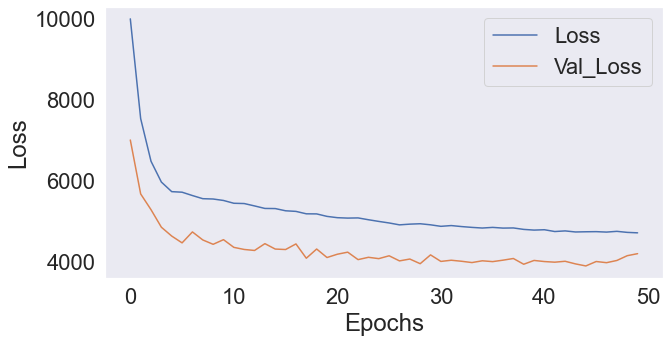

In [62]:
#Visualizing training and validaton loss
plt.figure(figsize = (10, 5))
plt.plot(model.history.history['loss'], label = 'Loss')
plt.plot(model.history.history['val_loss'], Label = 'Val_Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid()
plt.legend()

In [63]:
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

Text(0, 0.5, 'Test_predicted')

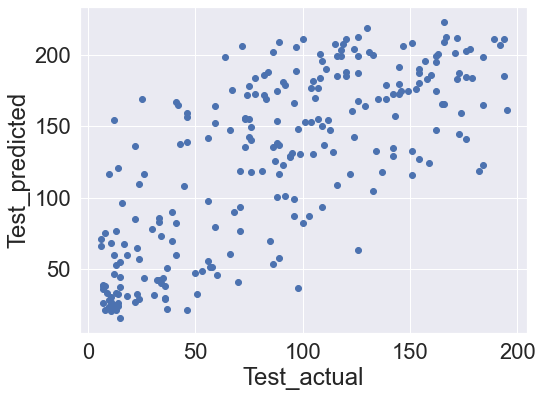

In [64]:
plt.scatter(y_test, y_test_pred)
plt.xlabel("Test_actual")
plt.ylabel("Test_predicted")

In [58]:
print('train RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_train, y_train_pred))))
print('train R2: {0:.3f}'.format(r2_score(y_train, y_train_pred)))

print('test RMSE: {0:.2e}'.format(np.sqrt(mean_squared_error(y_test, y_test_pred))))
print('test R2: {0:.3f}'.format(r2_score(y_test, y_test_pred)))

train RMSE: 6.58e+01
train R2: 0.463
test RMSE: 5.52e+01
test R2: -0.027


In [59]:
Data cleaning and EDA

1. base model: linear regression, 
    performance low
    
2.random forest
   feature engineering
   hyperparameter tuning
   overfitting for the training set
    
3.time serires method model


4. LSTM
   feature selection
   feature enginering 
   grid search hyperparameters
   got the best model performance

SyntaxError: invalid syntax (<ipython-input-59-a01f28150b57>, line 1)